# Introduction To Rusty Axe

This notebook will give you a guided tour through using Rusty Axe.

We'll use the iris toy dataset for simplicity and speed, but if you have a dataset you wish to analyize, you should feel free to copy this notebook and swap out the iris matrix for a matrix or an input/output pair of your choice!

Brief note about system requirements: the advantage of Random Forest Regressors is that they can run fairly efficiently by down-sampling large datasets during bootstrapping. You will need enough memory to fully load your dataset, but once it is loaded, the memory requirement per extra thread will depend on your bootstrapping settings. If you are running this on a laptop or personal machine, feel free to do a test run with the setting p=1. This will restrict the RF to a single thread and allow you to monitor memory usage. 

## Loading The Data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
# import scanpy as sc

import pickle 

data_location = "../data/iris/"

iris = np.loadtxt(data_location + "iris.tsv")
iris_features = np.loadtxt(data_location + "header.txt",dtype=str)

Firstly we will need to train a random forest regressor describing our data. We recommend starting with the built-in RFR because it has better support for unsupervised forests, but support for sk-learn based forests is also available. 

We need to describe several important settings here.

### Basic Settings:

* **input**: n by m numpy array. Rows should be samples, columns should be features (eg genes or measurements) If only one array is provided, Rusty Axe defaults to unsupervised mode, where features with the same name cannot be in both the input and the output.

* **header**: header of feature names. This will be enormously helpful for interpretation, so we recommend providing it here.

* **trees**: Numer of trees to train. For multi-output forests such as scRNAseq data, the number of unique trees is generally less important than the depth, so try it with 100 first. See saturation analysis tutorial for more information. 

* **input_feature_subsample** or **ifs**: Input feature subsampling rate, eg how many features can potentially be split on at each bootstrap. Rule of thumb: use 1/2 to 1/3 of all features. (eg if you are observing 2000 variable genes, say 700 here)

* **output_feature_subsample** or **ofs**: Output feature subsampling rate, eg how many features are evaluated for improvement in dispersion at each bootstrap. Apply similar rule of thumb as to inputs. 

* **sample_subsample** or **ss** Sample subsampling rate. Number of samples evaluated at each bootstrap. This parameter depends on how "grainy" your data is. If you are looking for small, rare clusters first, the rule of thumb should be to use higher values (500-1000). Conversely, if you are looking big, obvious clusters first, leave this value small (150-300)

* **depth**: Maximum depth of each tree. This value determines the complexity of the factors you will obtain. If your data isn't very complicated leave this value low. (~5-6) If your data has a lot of complexity and heterogeneity, set this value higher. (8-10)

### Optimization Metrics:

* **split_fraction_regularization** or **sfr**: Whether to normalize the disperison metric by the population of leaves. 0 if using ssme or sme, 1 if using var or mad.

* **norm**: 'l1' or 'l2', which norm to use when summing disperion improvement over multiple features. (eg if variance improvement for F1 is .5 and for F2 is .3 then L1 norm means the overall iprovement is .5 + .3 = .8, while the L2 norm is .5^2 + .3^2 = .34. Defaults to L1

* **dispersion_mode**: What is the dispersion measure of the forest? Defaults to SSME, options are SSME, SME, MAD, Var (variance)

* **standardize**: whether to standardize the improvement in dispersion by dispersion. Defaults to true. 

* **reduce_input** and **reduce_output**: supply the string 'true' or 'false'. These parameters dictate whether or not dimensional reduction is applied at each node split. For sparse data such as scRNAseq this can be enormously helpful in making more highly interpretable trees. On the other hand if your data is poorly behaved under dimensional reduction, this setting can be set to 'false'. 
 
### Other: 
 
* **cache**: This setting is true by default, but please keep it in mind if you need to train a very large forest, or one with a huge number of features. This setting prevents Python from caching a variety of values within individual nodes, potentially saving much space in memory, but it slows down all computations considerably. Set this to false when you wish to train a very large forest and then immediately filter it to a smaller forest based on some criterion. 


In [2]:
import rusty_axe
import inspect
inspect.getfile(rusty_axe)

'/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/__init__.py'

In [3]:
from rusty_axe import lumberjack

forest = lumberjack.fit(
    input_counts=iris, 
    output_counts=iris,
    header=iris_features,
    trees=500,
    input_feature_subsample=2,
    output_feature_subsample=2,
    ss=50,
    depth=3,

    sfr=0,
    norm='l1',
    dispersion_mode = "ssme",
    standardize = "true",

    reduction = 2,
    reduce_input='true',
    reduce_output='true',

    cache = True,

)

Input:(150, 4)
Output:(150, 4)
Generating trees
Running /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5
Command: /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/bin/rf_5 -ic /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpeulfx_rx/input.counts -oc /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpeulfx_rx/output.counts -o /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpeulfx_rx/tmp -auto -ifh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpeulfx_rx/tmp.ifh -ofh /var/folders/_k/81hqlgss0tbf2l0t7wm4t_200000gn/T/tmpeulfx_rx/tmp.ofh -trees 500 -input_feature_subsample 2 -output_feature_subsample 2 -ss 50 -depth 3 -sfr 0 -norm l1 -dispersion_mode ssme -standardize true -reduction 2 -reduce_input true -reduce_output true
Read parameters

                                          Ingesting 0

                                          Working on trees (not in order)

Computing tree 1
Looking for clusters:/var/folders/_k/81hqlgss0tbf2l0t7

Forests aren't determsinistic in nature, so if you wish to continue an analysis that you started, don't depend on repeating the same calculations and getting an exactly identical answer. For convenience we instead provide this method of saving a forest so that you can reload it later. Most computations should be cached in the saved forest, but save after each computation you wish to cache! 

(Please note we currently use pickling to save the forest, so it is not portable between different systems. Ability to save the forest and load it on a different system is forthcoming)

In [4]:
forest.backup("./iris_forest")


Saving forest
./iris_forest


## Analyzing Nodes 

In [5]:
len(forest.nodes())

7114

Firstly we can visualize an embedding of our data using TSNE or UMAP to get a feel for the distribution of the underlying values

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:366: NumbaWarning: The TBB threading layer requires TBB version 2021 update 1 or later i.e., TBB_INTERFACE_VERSION >= 12010. Found TBB_INTERFACE_VERSION = 11103. The TBB threading layer is disabled.
  warnings.warn(problem)


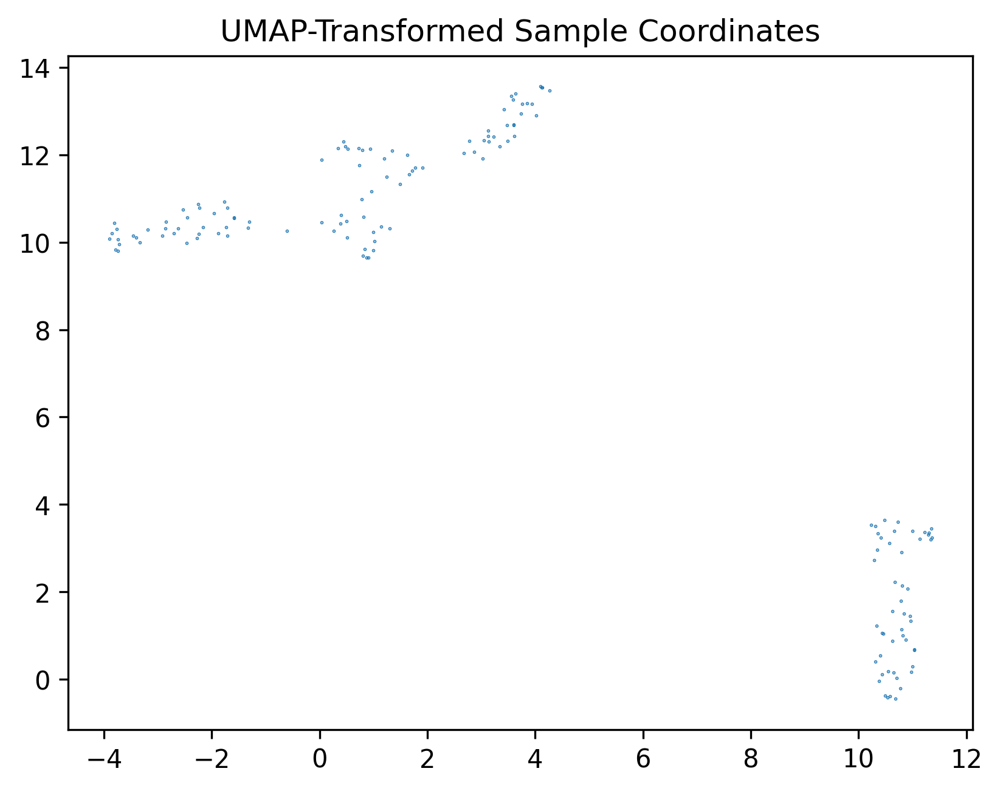

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


In [6]:
_ = forest.coordinates(type='umap')

Now we can take a quick look at the nodes in our forest. 

So as not to overwhelm our computer we can work with nodes of a restricted depth for the moment (of course an iris definitely won't overwhelm your computer, but if you are following along with this tutorial using a larger dataset, restricting the depth here will be very helpful. try depth=5)


In [7]:

nodes = forest.nodes(
    depth = 3
)


We will construct some representations of our nodes and visualize them to get an idea of what's happening in 
our forest

A node sample encoding is a binary matrix of node x sample. Each element i,j is 1 if node i contains sample j,
and 0 otherwise. 


In [8]:
node_sample_encoding = forest.node_representation(nodes,mode='sample')


If nodes frequently contain the same samples, this will likely indicate that those samples are similar in some way.


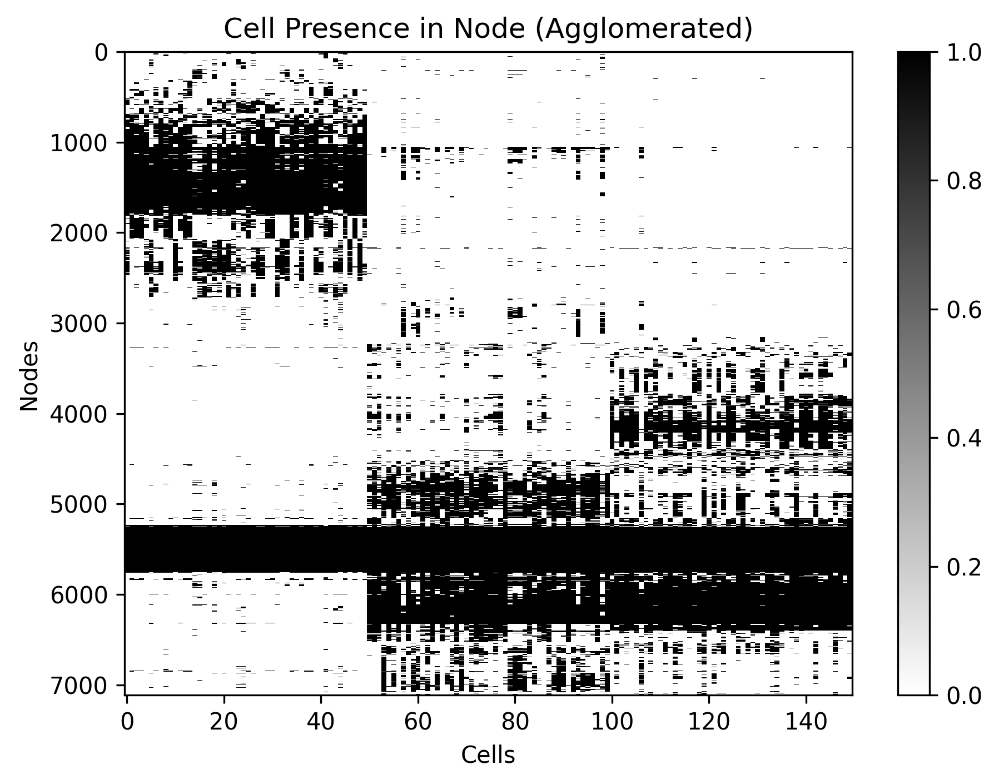

In [9]:
from scipy.cluster.hierarchy import linkage,dendrogram

sample_agglomeration = dendrogram(linkage(node_sample_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_sample_agglomeration = dendrogram(linkage(node_sample_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_sample_encoding[node_sample_agglomeration],cmap='binary',aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()


Now let's look at a few other kinds of encodings

A conditional gain encoding is a matrix of nodes x features, where element i,j is the difference in the mean for feature j in node i compared to the parent of node i. It represents the "prediction" or regression that each node makes. 


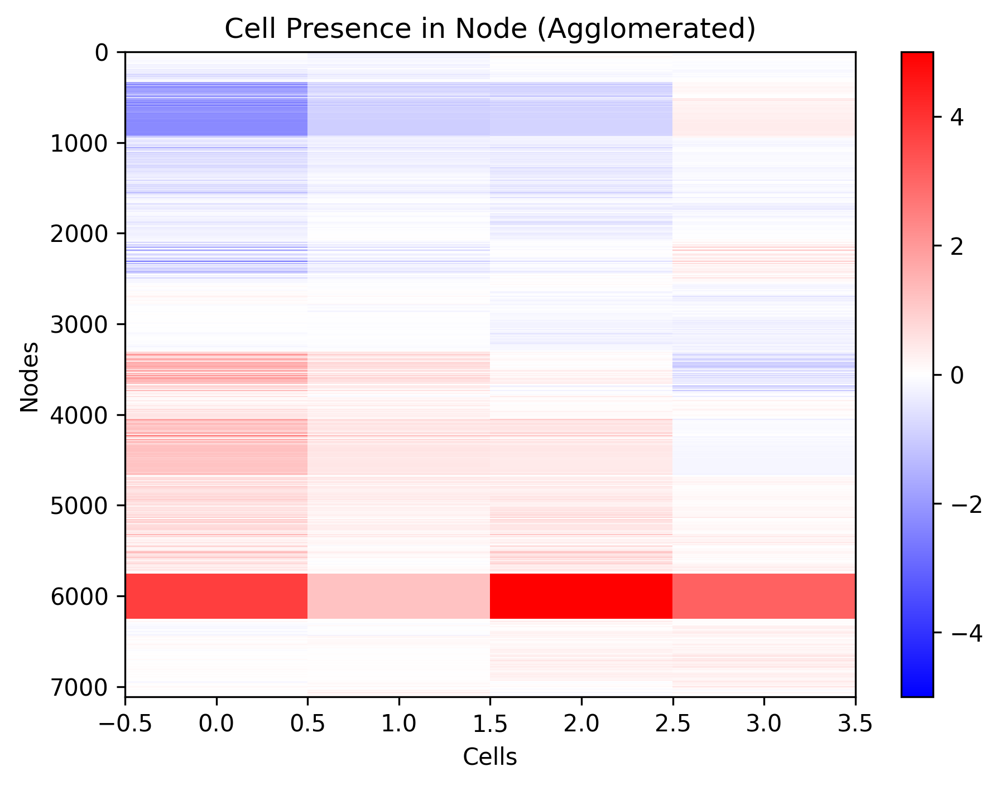

In [10]:

node_gain_encoding = forest.node_representation(nodes,mode='conditional_gain')


feature_agglomeration = dendrogram(linkage(node_gain_encoding.T, metric='cosine', method='average'), no_plot=True)['leaves']
node_gain_agglomeration = dendrogram(linkage(node_gain_encoding, metric='cosine', method='average'), no_plot=True)['leaves']

plt.figure()
plt.title("Cell Presence in Node (Agglomerated)")
plt.imshow(node_gain_encoding[node_gain_agglomeration].T[feature_agglomeration].T,cmap='bwr',vmin=-5,vmax=5,aspect='auto',interpolation='none')
plt.xlabel("Cells")
plt.ylabel("Nodes")
plt.colorbar()
plt.tight_layout()
plt.show()

Now let's cluster the nodes of our RFR and see if any patterns emerge. 

We can cluster the nodes of a forest using the built-in method interpret_splits

It has the following options of note:

* **mode**: Choose among any of the node representations. Defaults to 'partial'. I can also recommend experimenting with 'mean', 'additive', and 'sister', but 'partial' usually performs best

* **metric**: which metric to use to evaluate the similarity of encodings. For high-dimensional data 'cosine' is usually best, but for data with relatively fewer dimensions 'euclidean' or 'manhattan' can be useful also. (Choose any of the scipy distance metrics)


The following are tuning parameters. Default values should be fine, but we make them available to you just in case:

* resolution: a hint about the resolution of the node clusters you wish to see. Higher = more clusters, lower = fewer clusters. If you feel like you are over-clustering your data try setting this lower.

* k: nearest neighbor parameter passed to leidenalg. For full details see the leidenalg package, but this is similar to inverse resolution. k=50 will produce more clusters than k=200. A defualt of 100 is usually fine. 

In [11]:
forest.interpret_splits(
    depth=2,
    mode='partial',
    metric='euclidean',
)

No sample clusters
No split clusters
No leaf clusters
WARNING, PCA DIMENSION GREATER THAN FEATURE DIMENSION, PICKING MINIMUM
Node 2000

Node 2000

Complete:2971

Searching for partition
Louvain: (2972,)


array([1, 2, 8, ..., 4, 3, 0])

Alternatively, you construct the node representations and cluster them yourself by a method of your choice.

If you've clustered all the nodes in a forest, you can set the inferred node clusters using the method "external_split_labels" which has the following arguments:

* **nodes**: The nodes for which labels are available
* **labels**: The corresponding labels. Labels have to be numeric, start from 0, and be continous. (eg 0:9 ok, 3:F not ok) 



* **roots**: a special boolean argument that specifies whether you included roots in the list of nodes above. If set to "False" (default), then all roots are labeled as cluster 0. All the rest of the labels are incremented up one (Note: Roots have degenerate sample, partial, and sister representations, so they're usually easier to exclude from clustering procedures.)


In [13]:
# forest.external_split_labels(
#     nodes=[nodes here],
#     labels=[your labels here]
#     roots='True'
# )

# Set roots to True if you included roots in the nodes you are clustering. This is generally undesirable since r

Now we would like to visualize the approximate consensus tree structure in our random forest. 

The next function should provide you with an HTML report of the forest. (Please be patient, it takes a little while to render the complete report) 

Summarizing:0
Error: P:[101.96440452  27.95668663 462.93785762  86.60652029],A:[nan nan nan nan]
Error ratio: [nan nan nan nan]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:3420: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/numpy/core/_methods.py:181: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


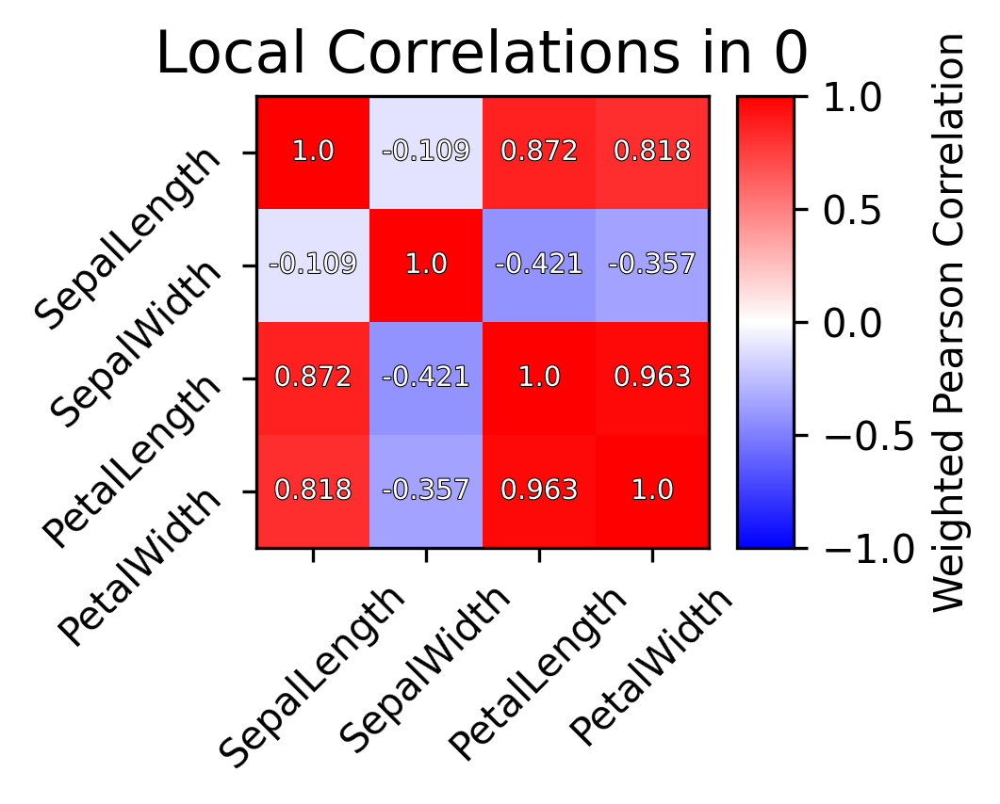

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


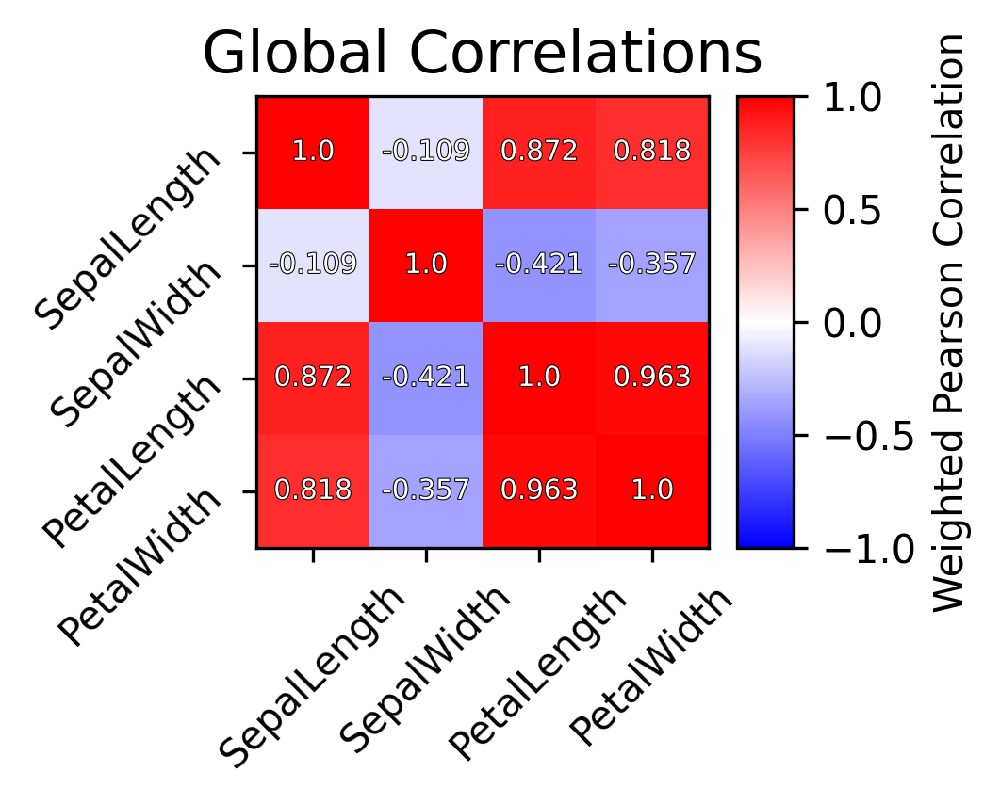

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/0/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:1
Error: P:[ 22.24411334   5.85570791 107.0768833   20.19864109],A:[ 32.0533104    5.59900129 133.32677288  26.1671217 ]
Error ratio: [0.70323102 1.03890083 0.80458185 0.78030501]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


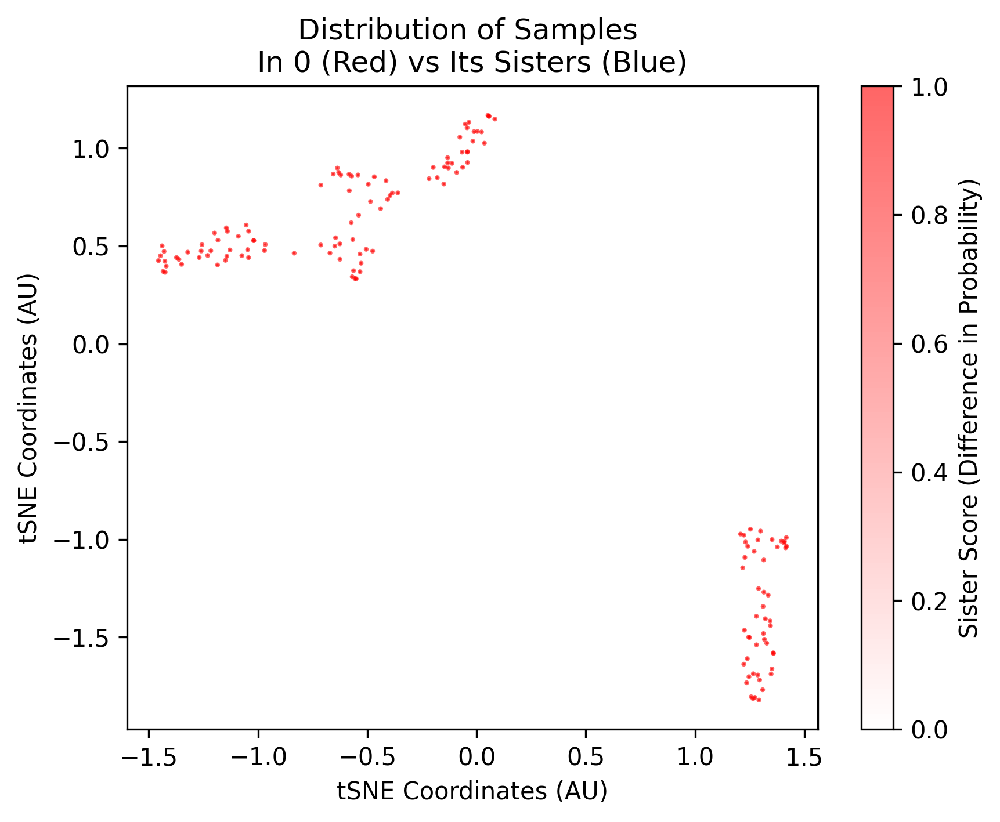

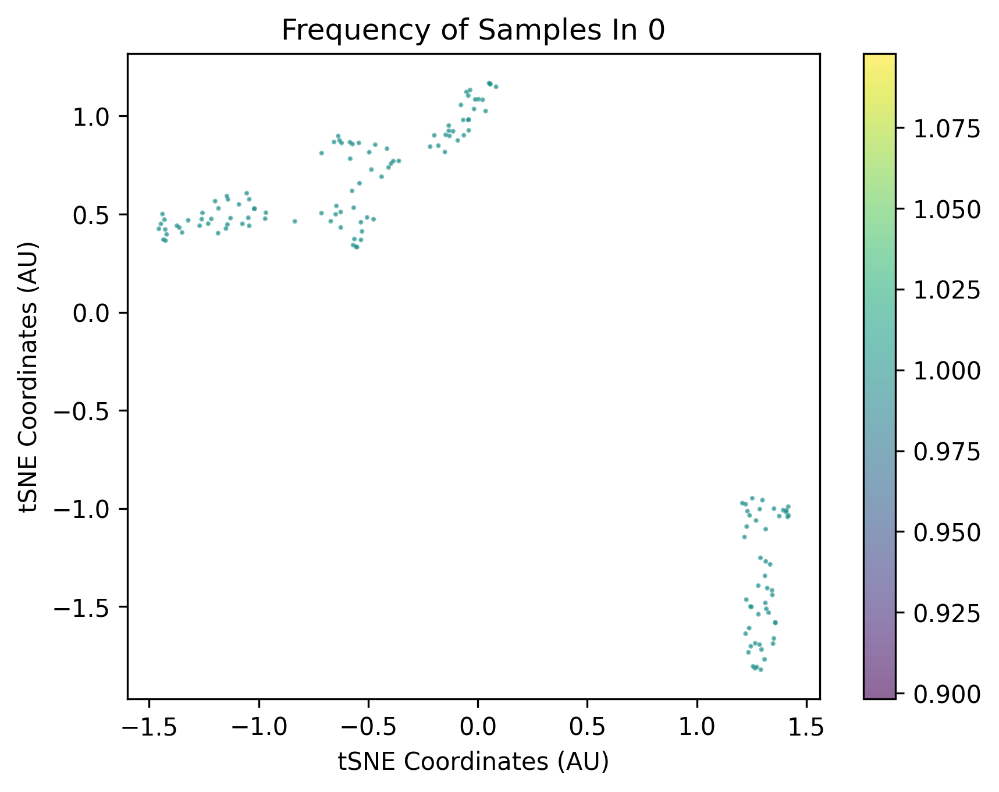

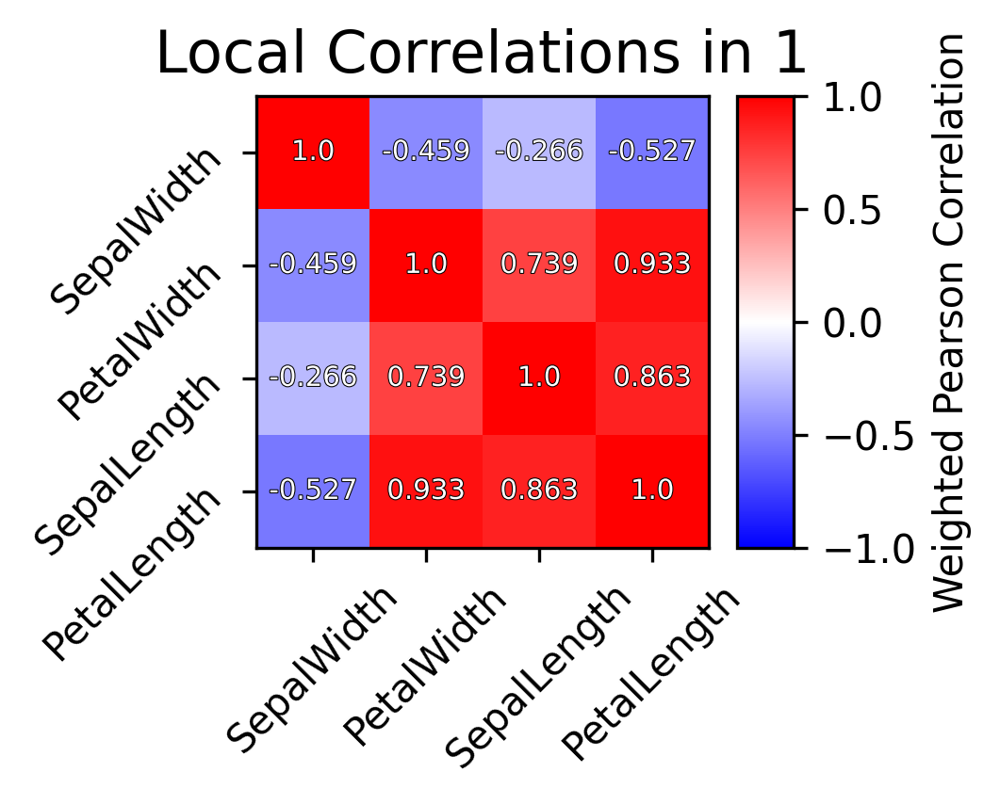

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


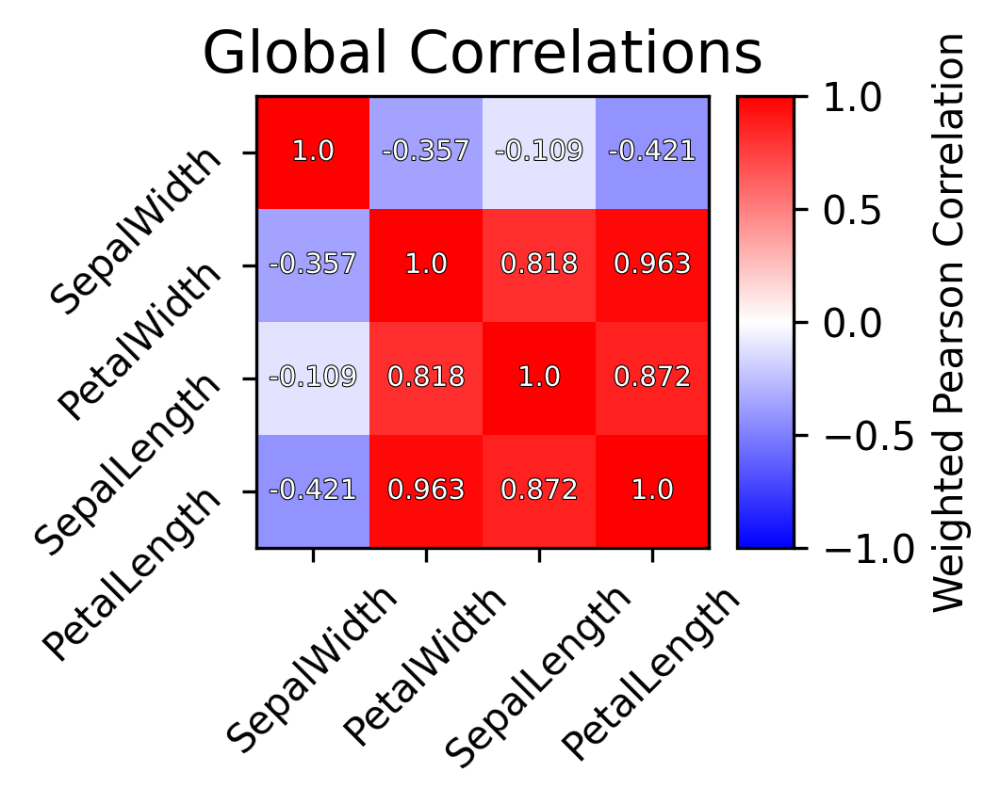

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/1/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:2
Error: P:[18.14480666  5.62654244 80.71214484 14.78069705],A:[18.50460232  7.20896175 74.94381694 13.8876012 ]
Error ratio: [0.98155329 0.80723271 1.0759552  1.05998924]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


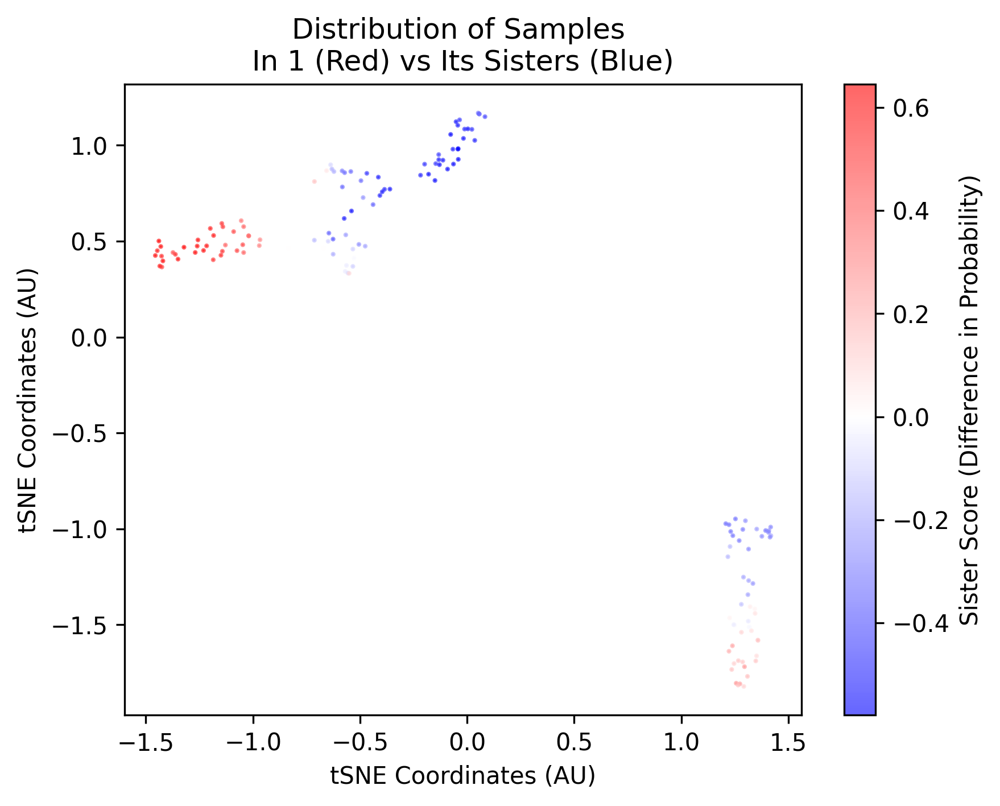

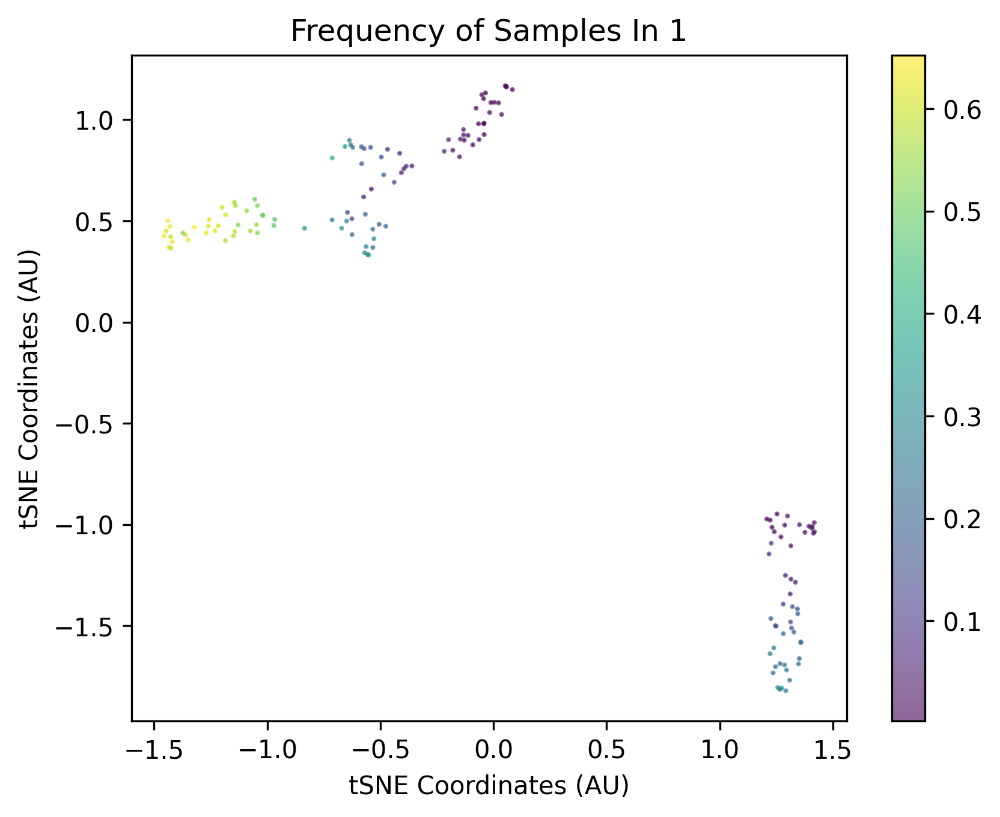

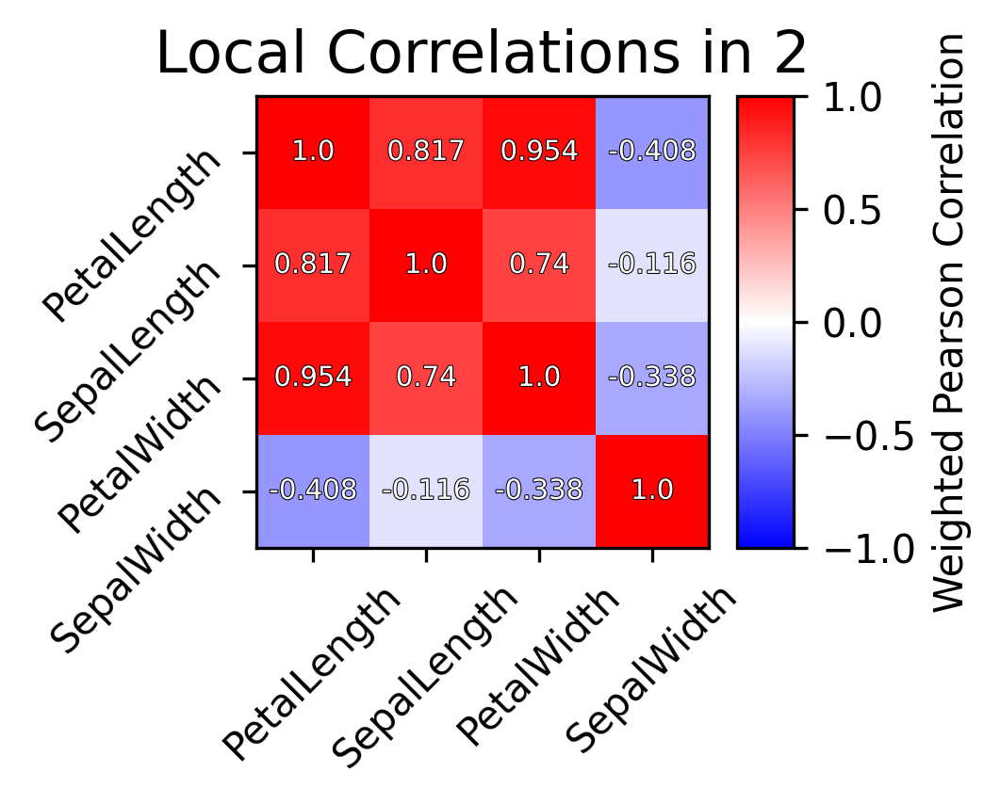

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


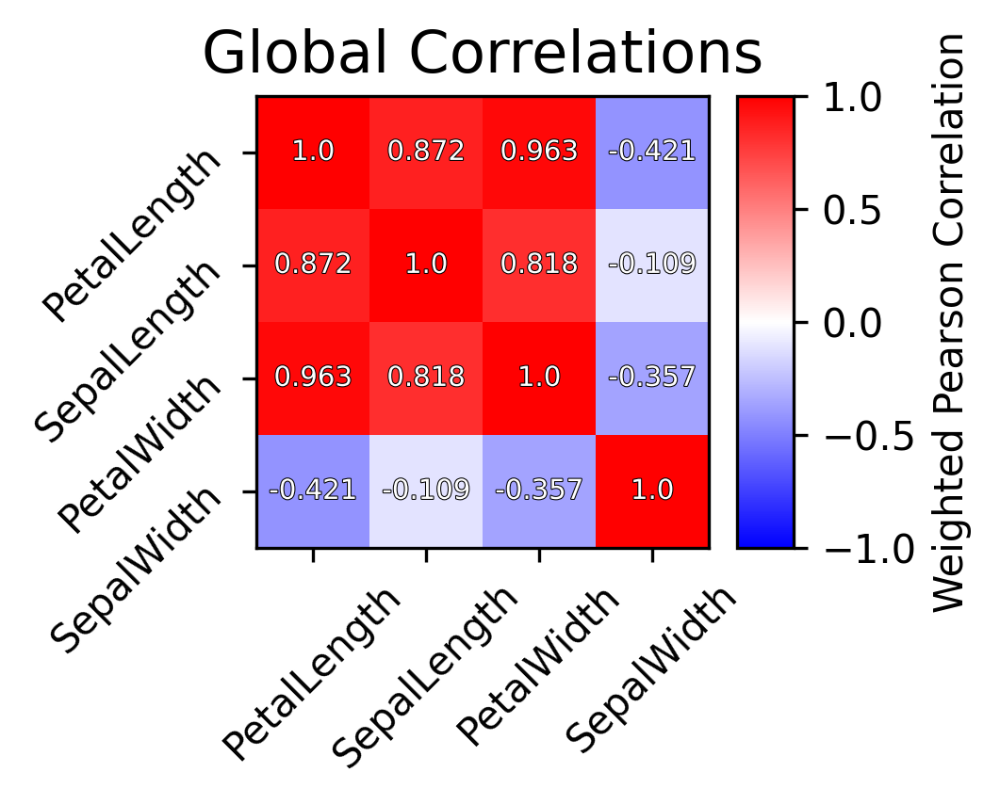

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/2/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:3
Error: P:[ 6.14223663  8.69813476 10.99191068  2.08391395],A:[ 38.88252346  13.23203361 240.23931849  41.91435914]
Error ratio: [0.17908186 0.68143001 0.0497096  0.07186205]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


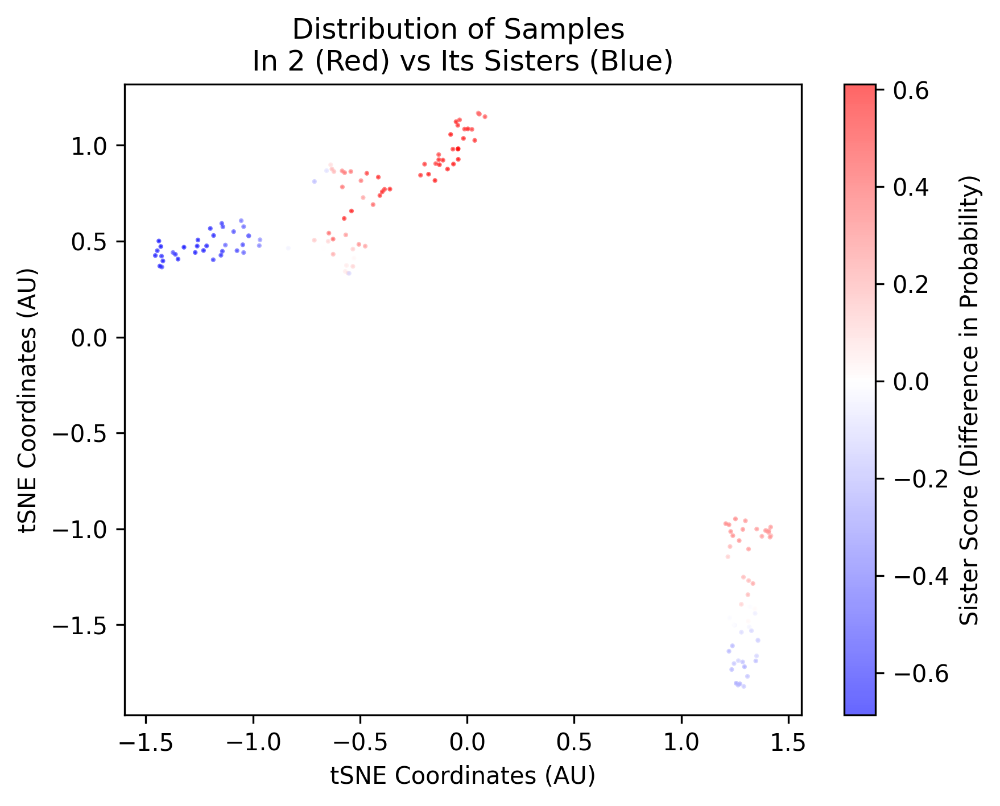

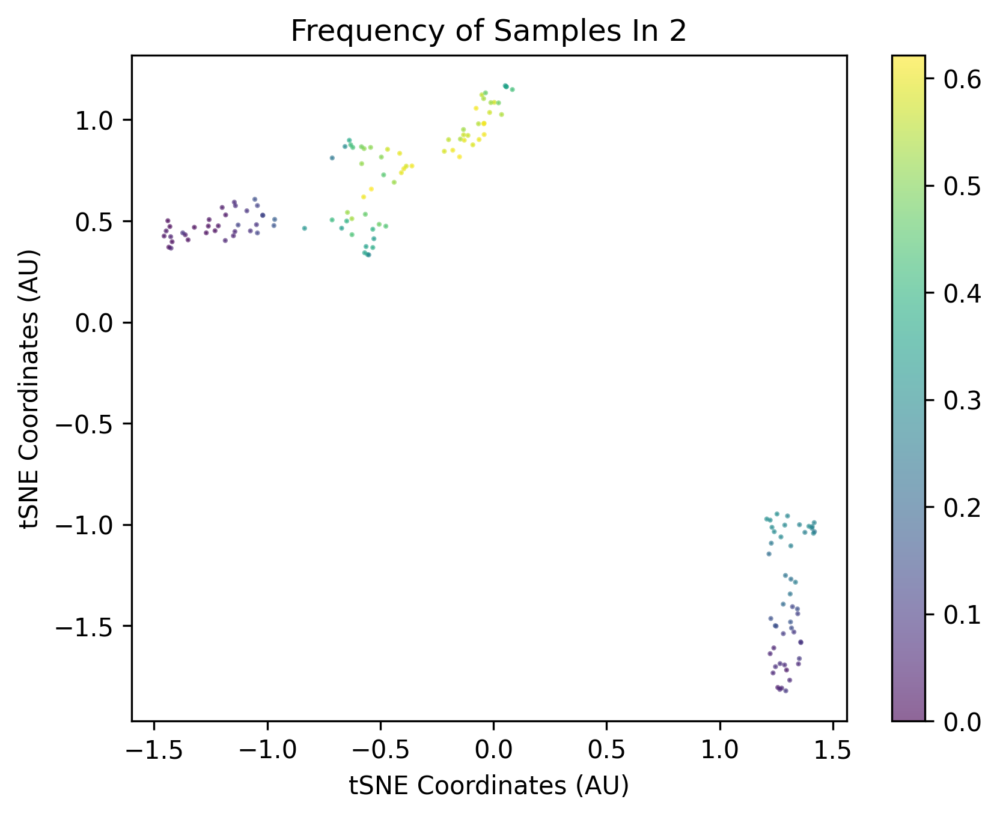

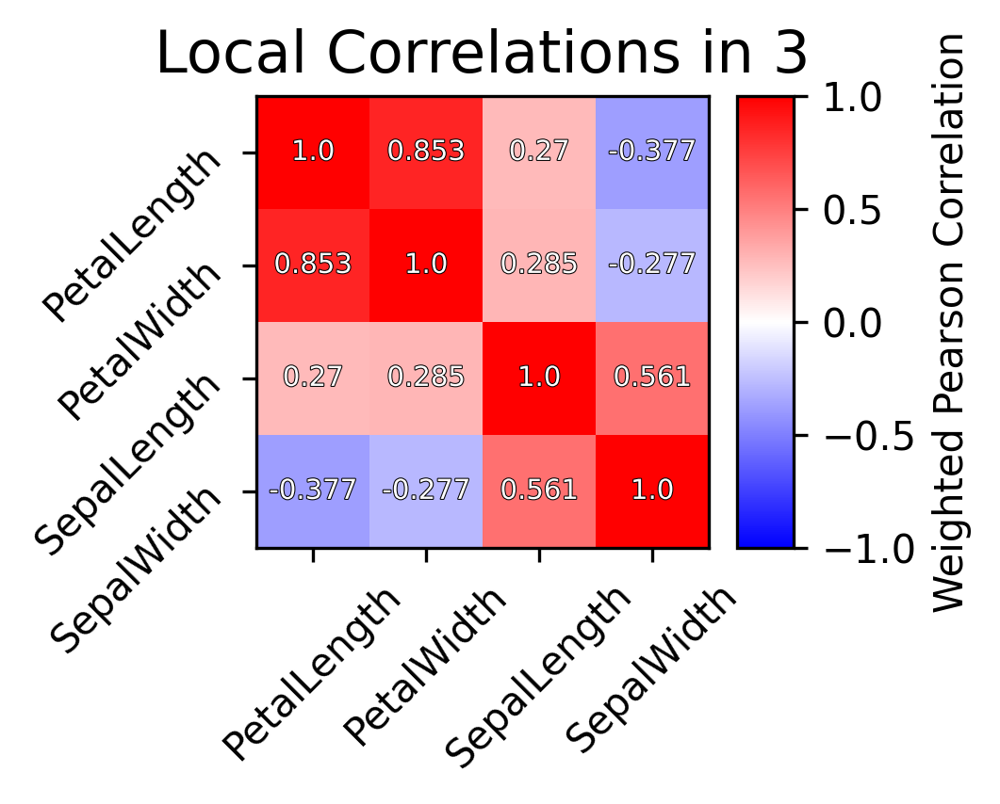

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


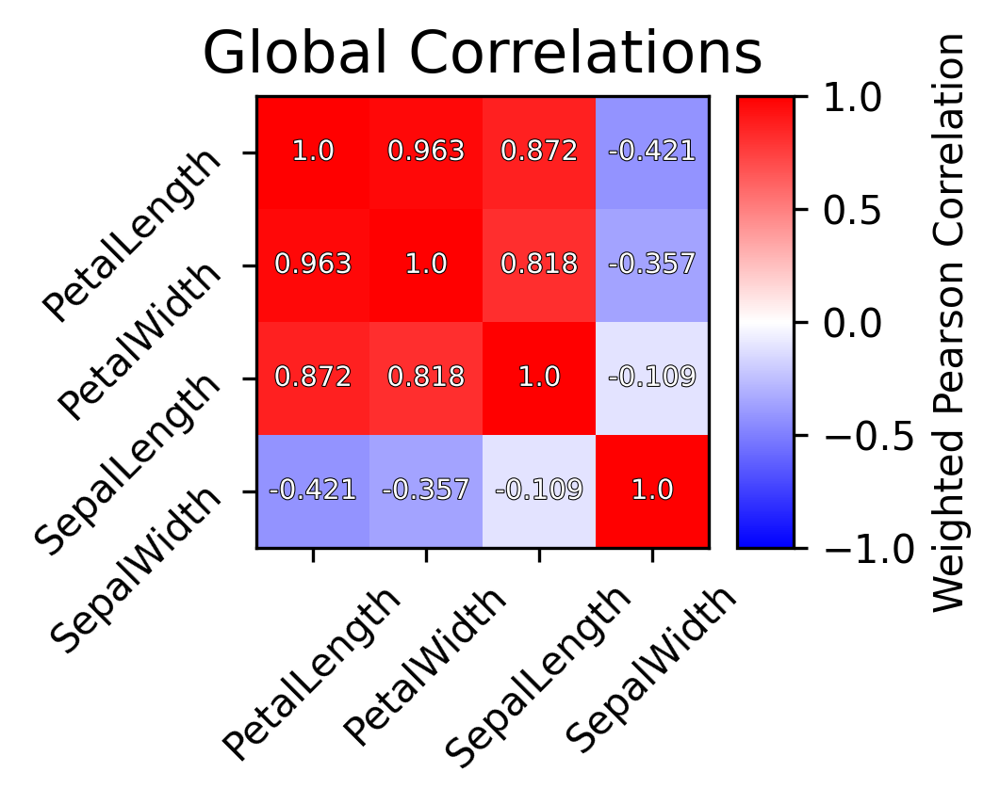

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/3/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:4
Error: P:[39.23603096 10.29045415 67.53764303 17.37311849],A:[ 57.08056253  13.19445044 197.31086322  39.91121868]
Error ratio: [0.69276242 0.79541326 0.3456071  0.44909732]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


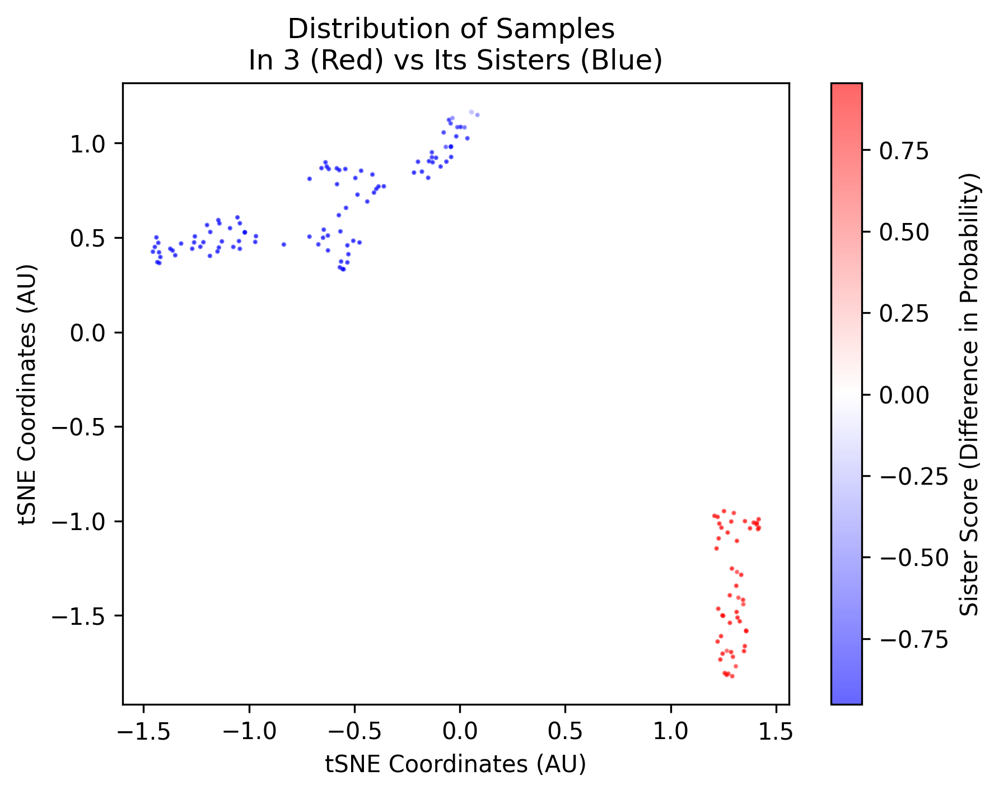

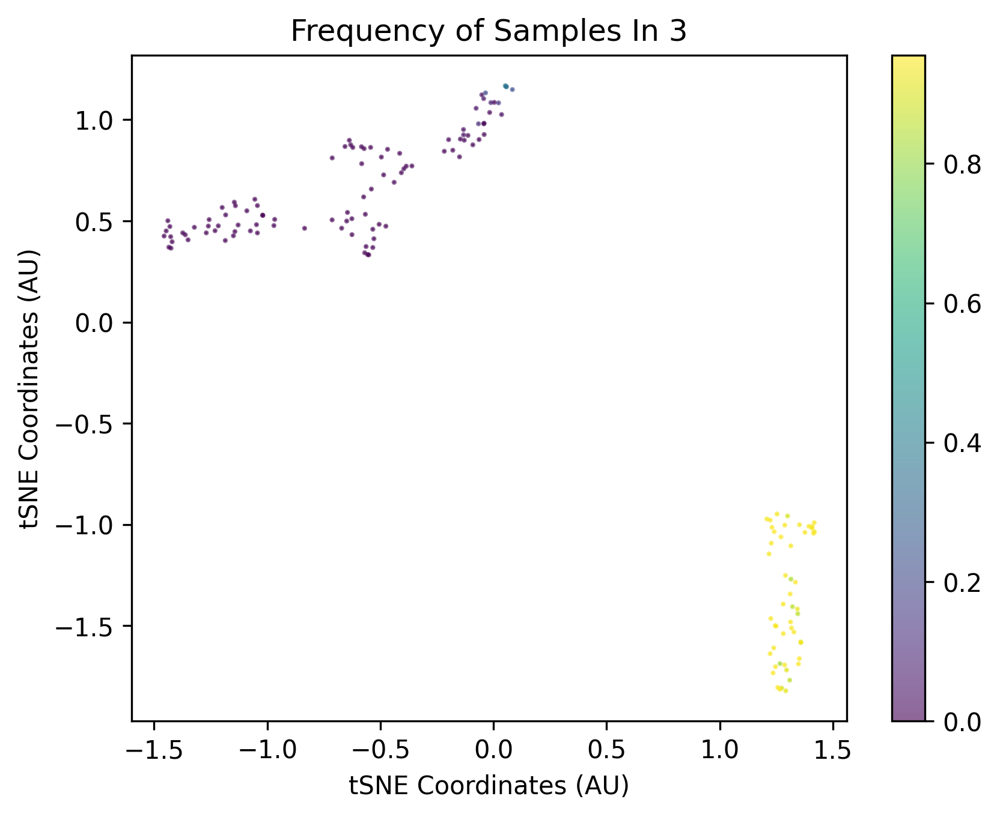

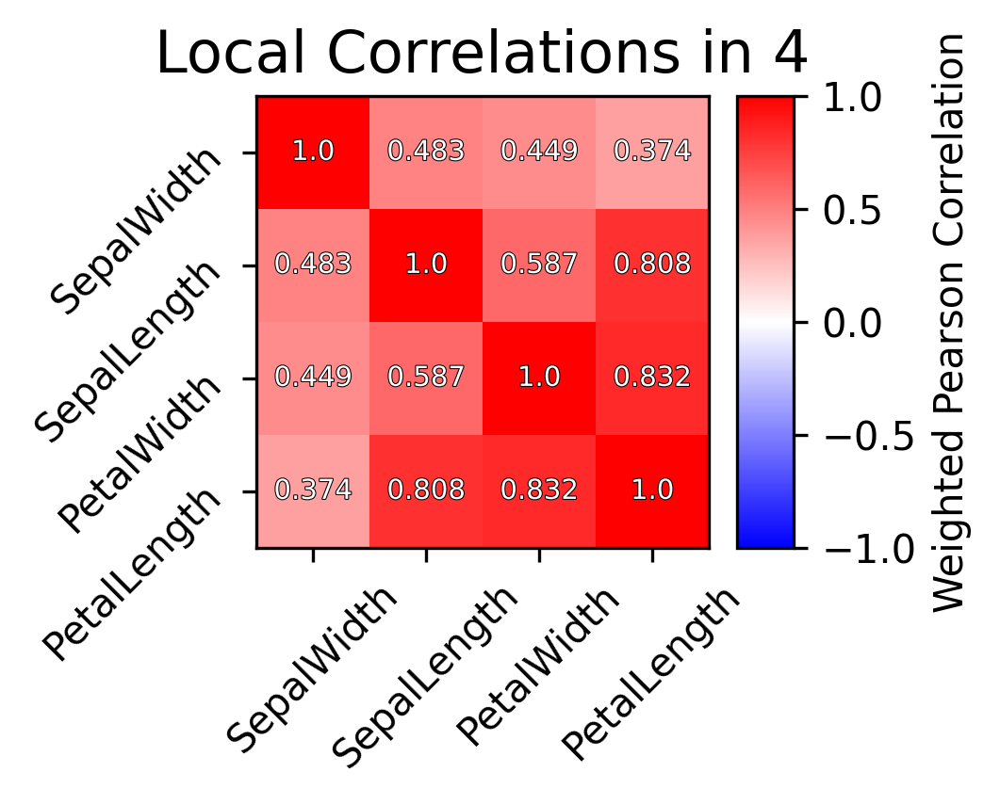

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


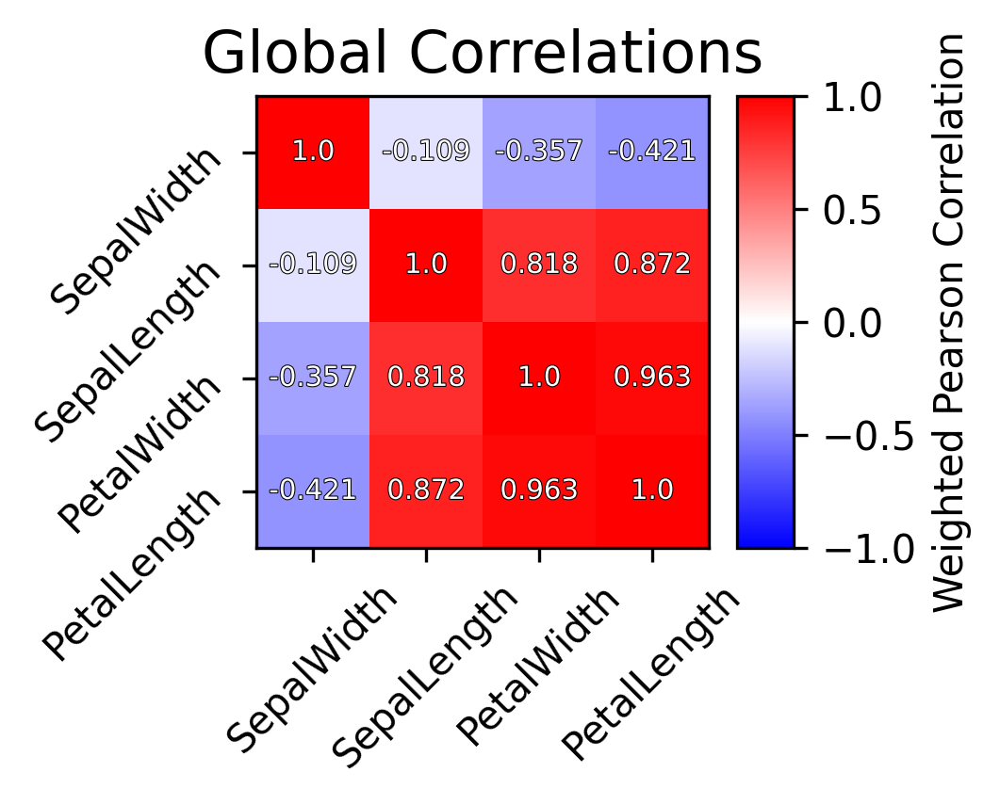

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/4/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:5
Error: P:[ 19.61754916  10.60963327 113.11970932  19.72576025],A:[ 26.9410314   10.59236579 142.78462495  25.35527539]
Error ratio: [0.73789506 1.00148956 0.79368506 0.78639893]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


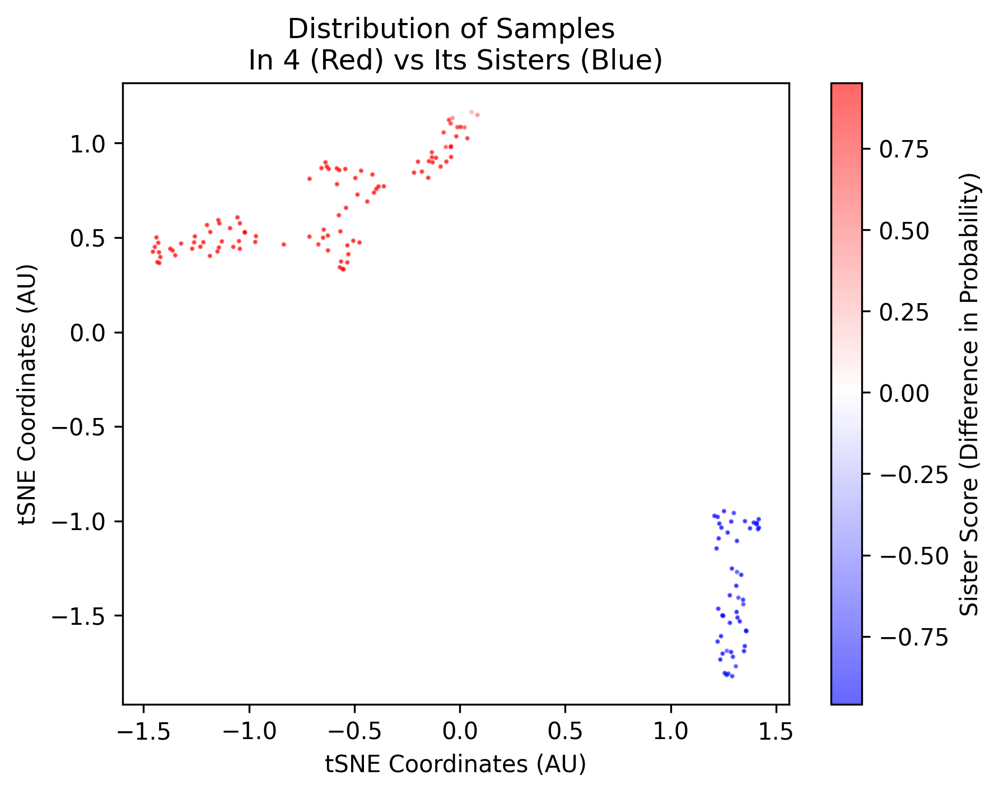

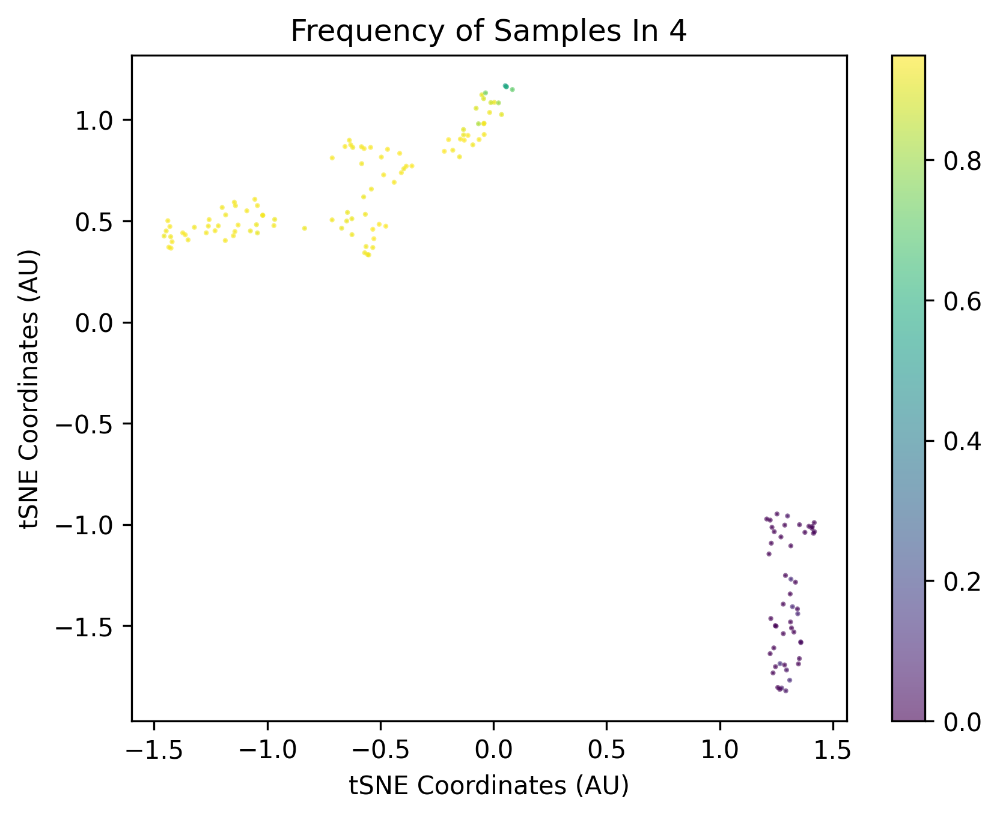

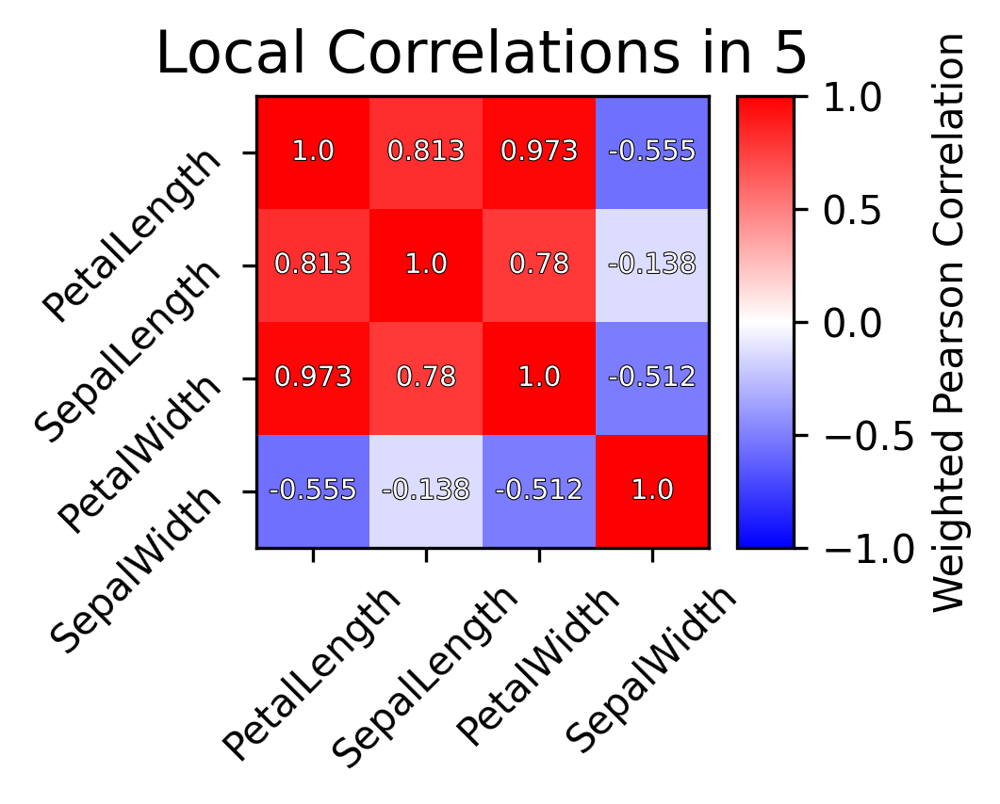

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


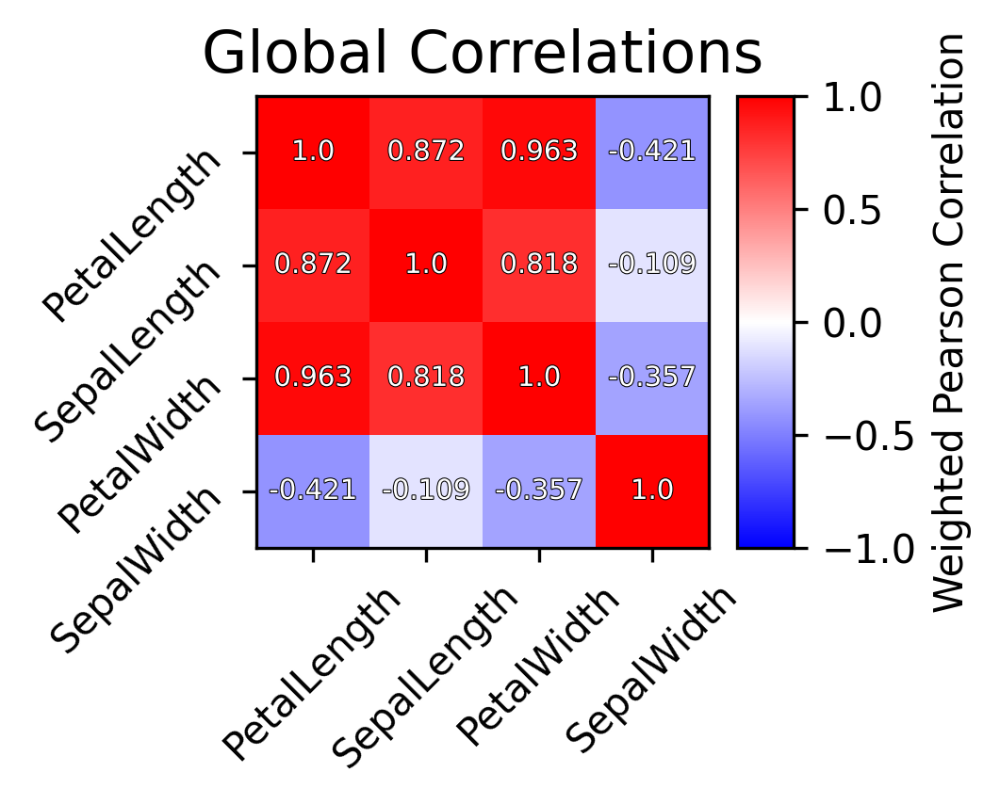

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/5/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:6
Error: P:[30.12774945  9.2880288  89.95490646 19.56167436],A:[ 46.07835938   9.65368941 167.1226457   33.23219259]
Error ratio: [0.66119019 0.96567756 0.5410033  0.60065315]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


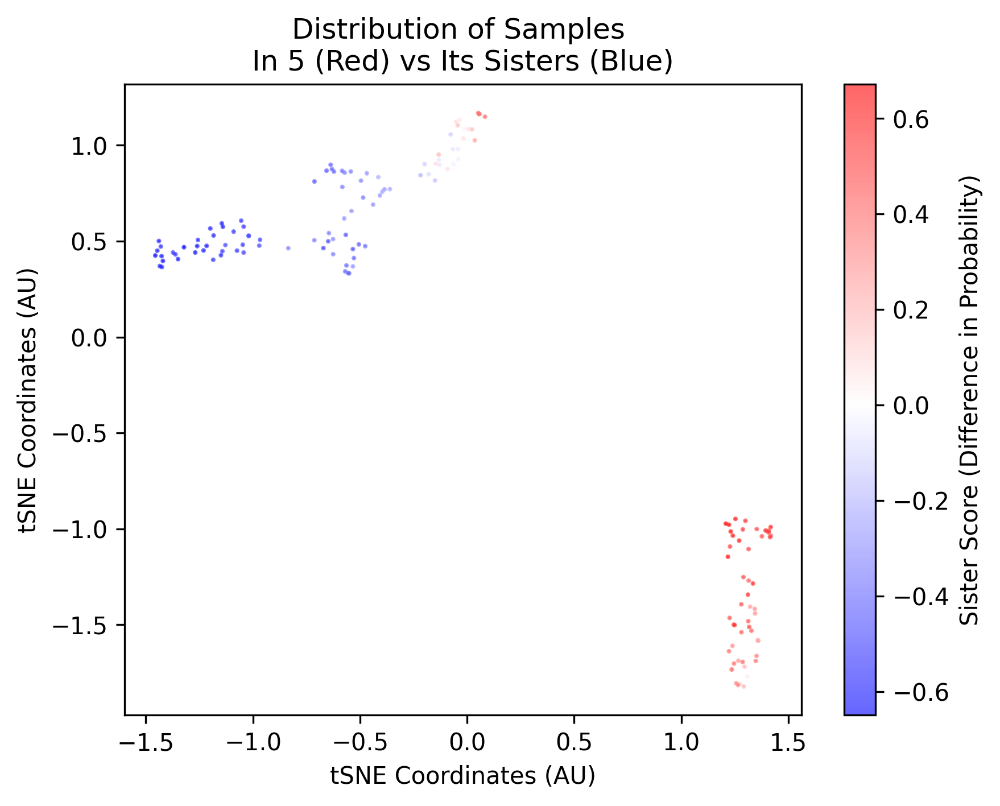

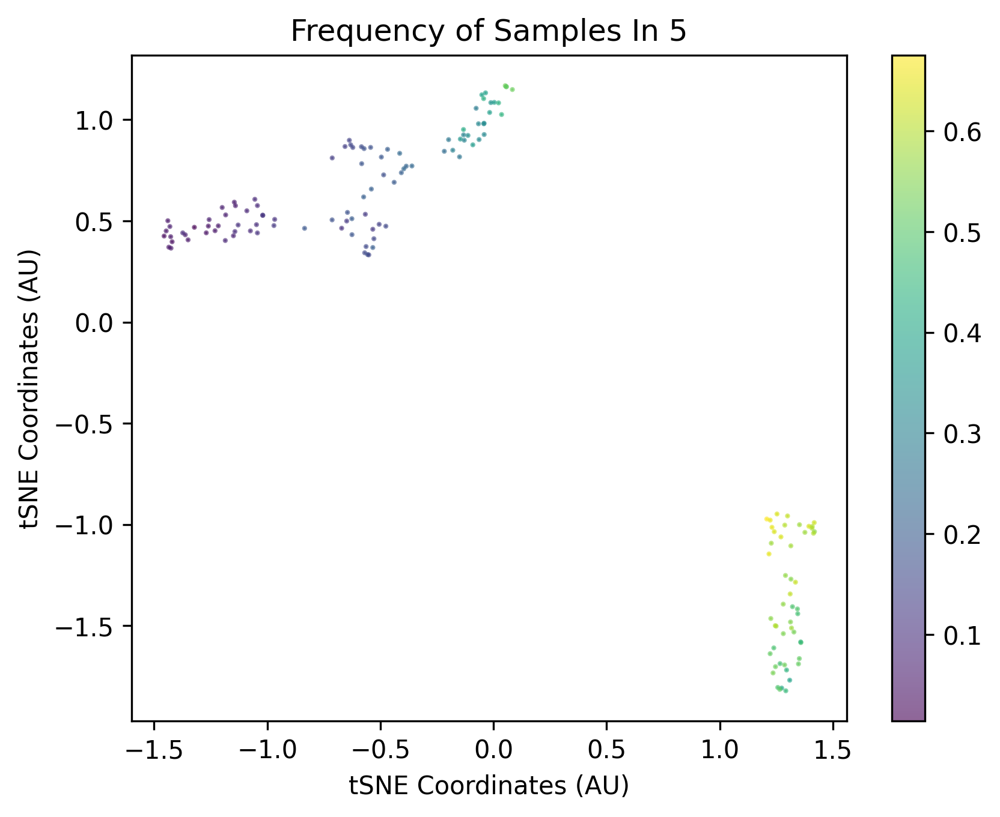

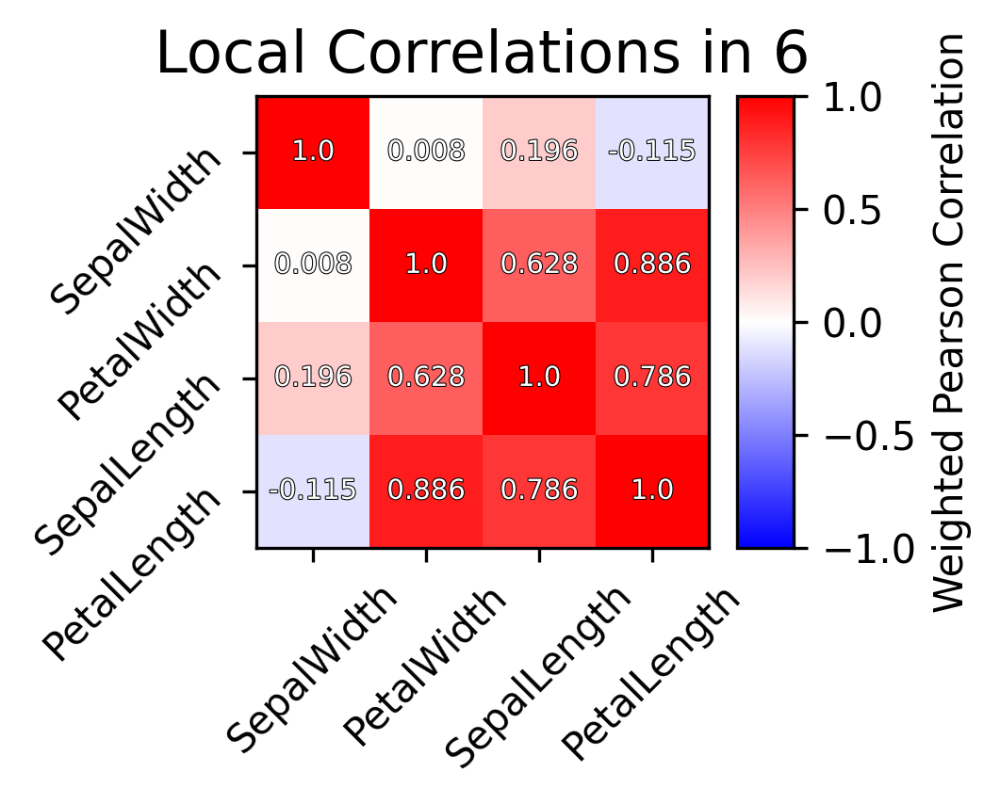

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


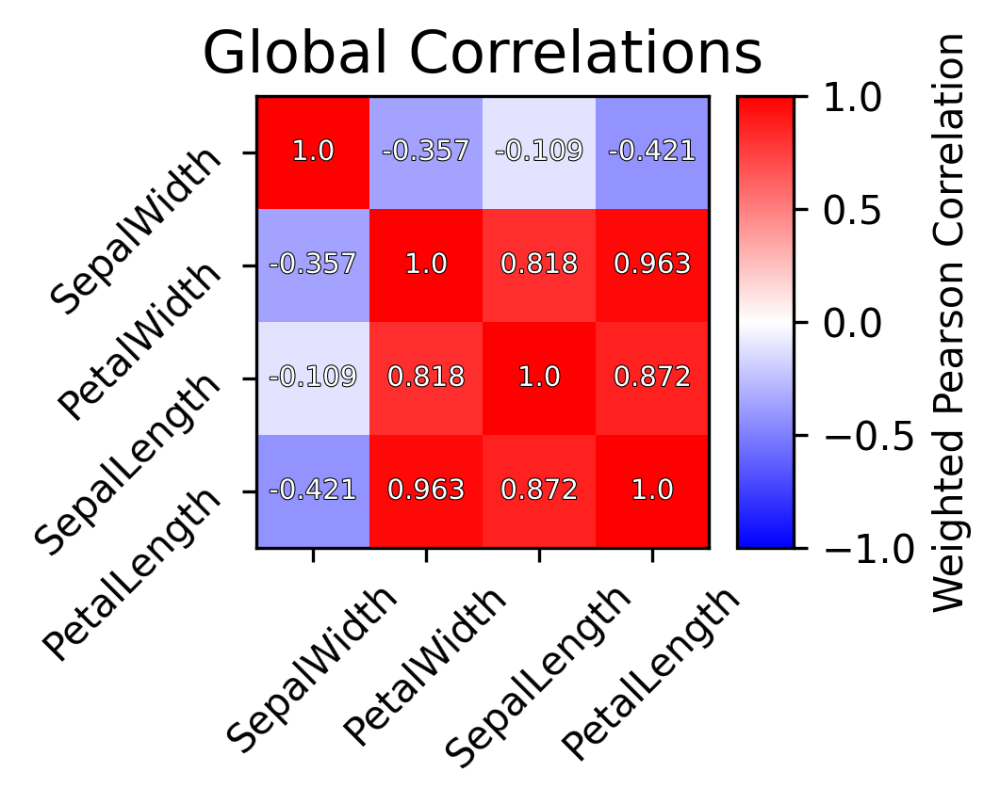

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/6/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:7
Error: P:[ 4.18028216  2.87260218 17.40441456  3.30609925],A:[ 5.37043675  5.93023917 50.95961752  8.92517304]
Error ratio: [0.81317535 0.55879777 0.35420612 0.43385634]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


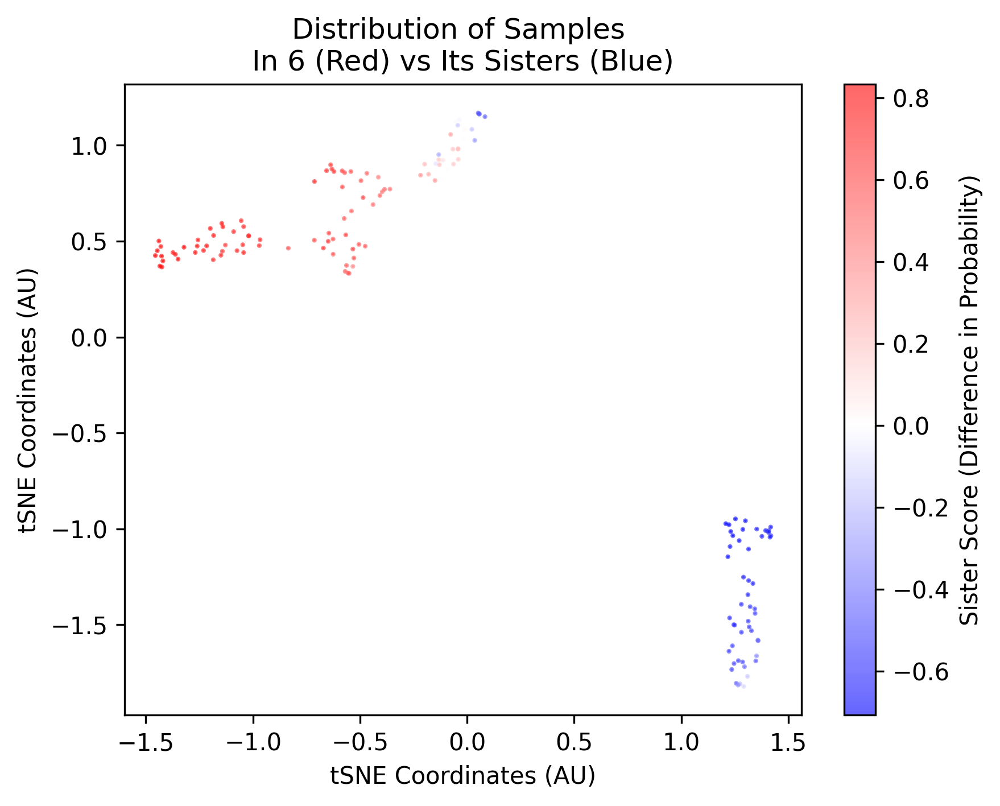

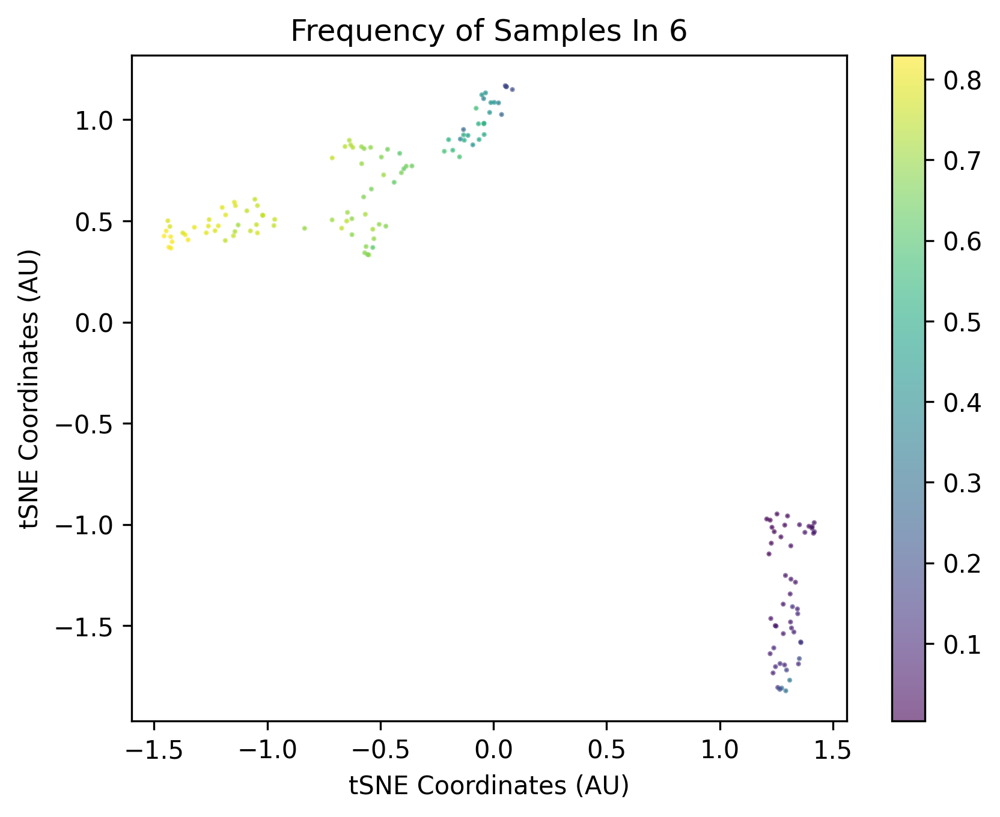

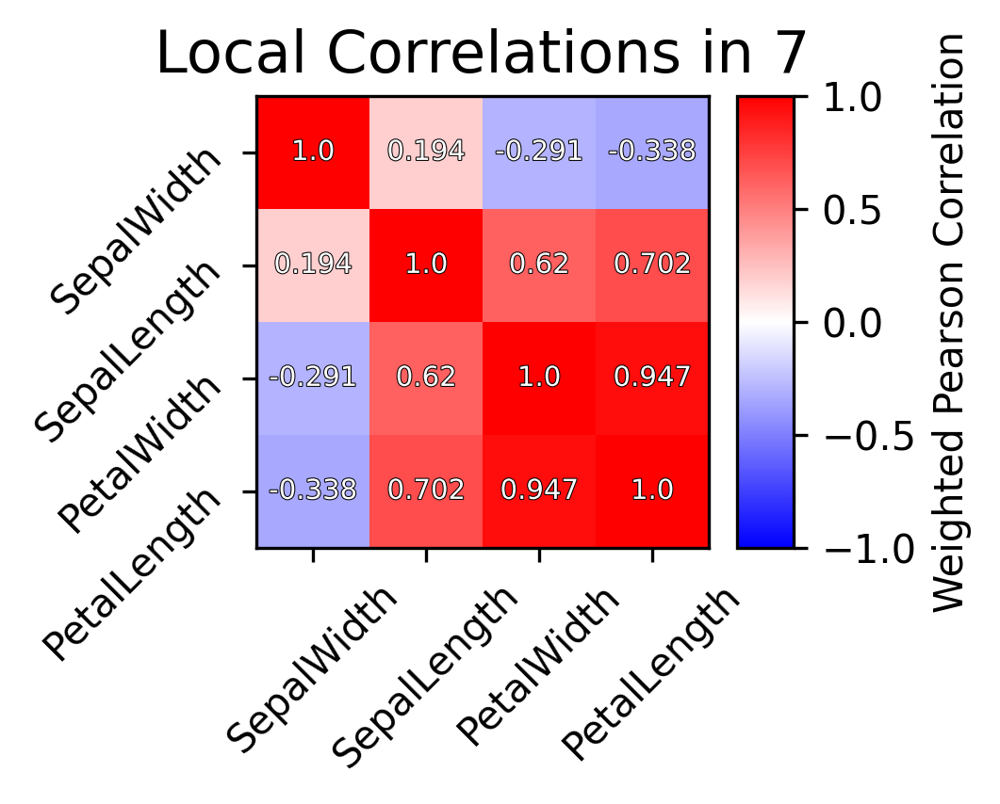

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


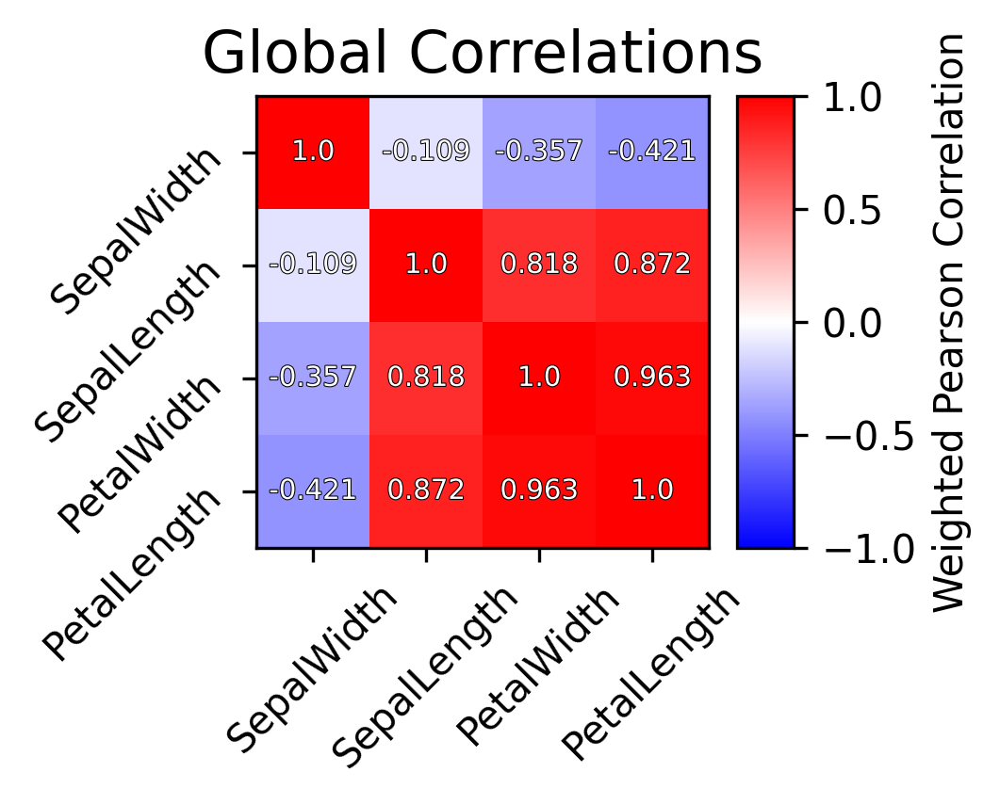

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/7/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:8
Error: P:[5.49512914 6.58717407 3.93367994 0.98615918],A:[ 5.76808583  7.46598092 11.34824987  2.24551794]
Error ratio: [0.95967003 0.89619551 0.39954487 0.61196987]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


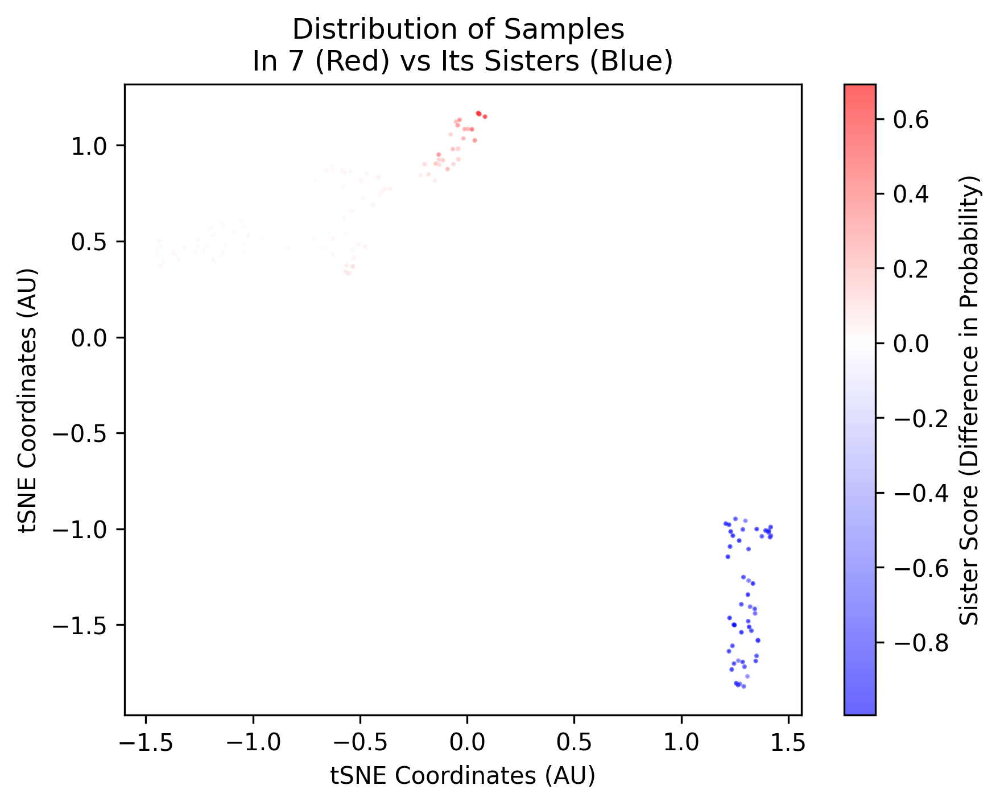

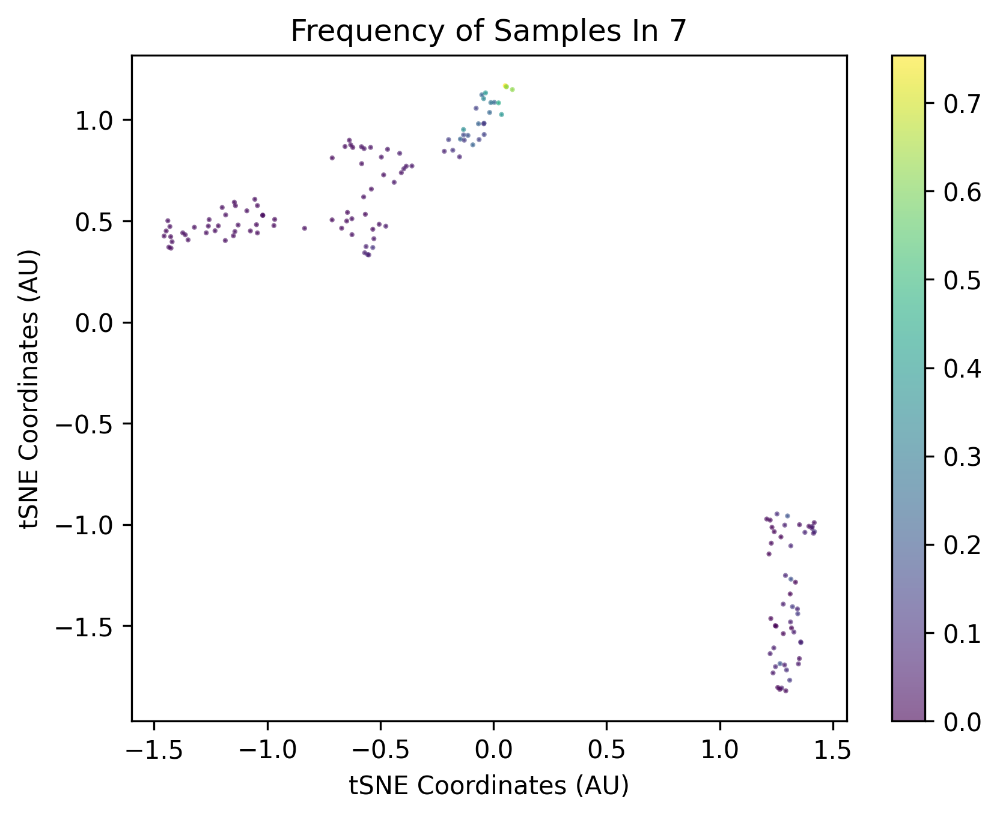

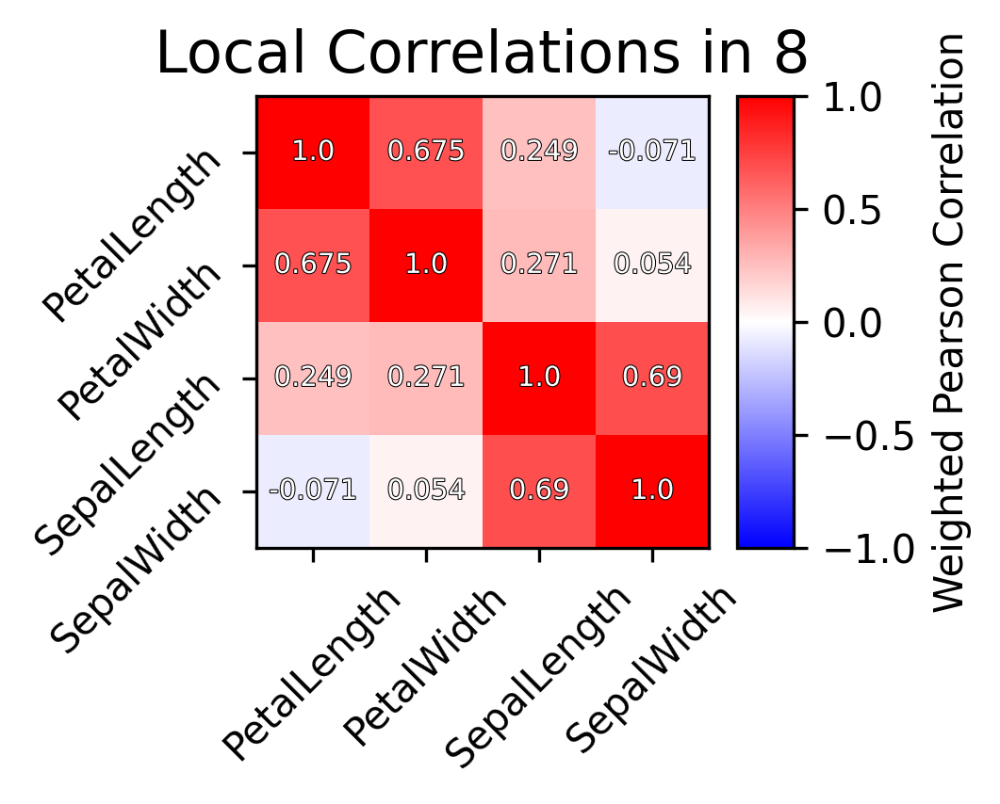

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


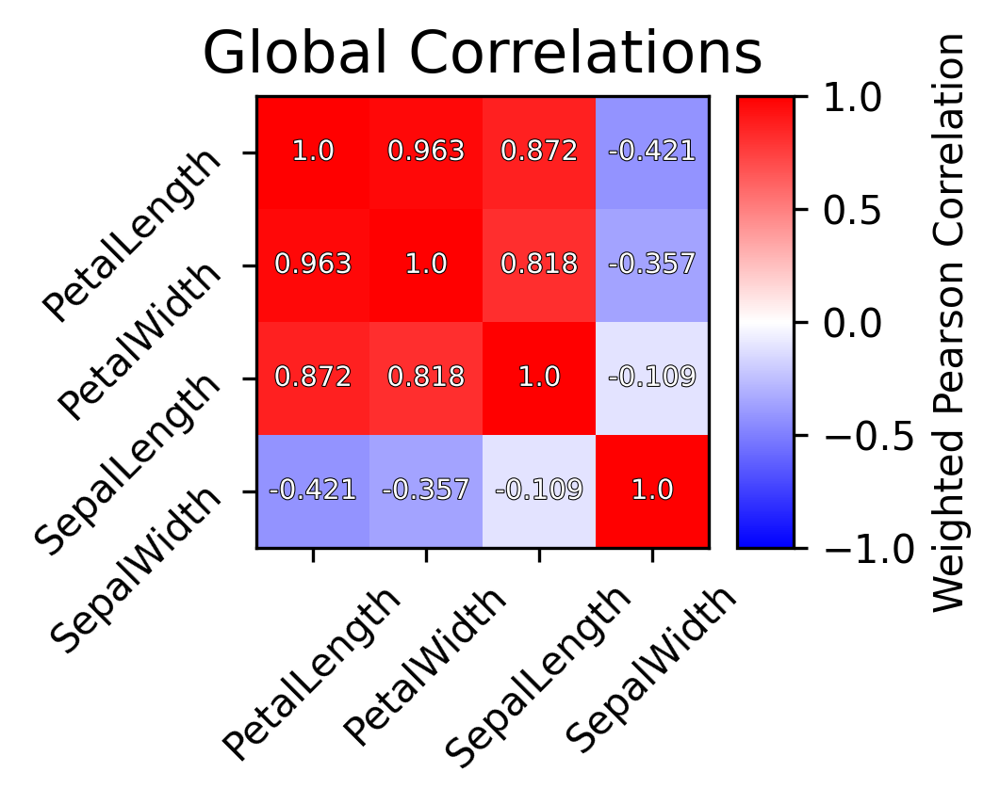

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/8/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:9
Error: P:[ 29.99118781   6.72950165 148.90333221  29.13910625],A:[ 30.40709103   7.66062778 146.56632718  28.85997661]
Error ratio: [0.98675767 0.89248746 1.01583698 1.00934795]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


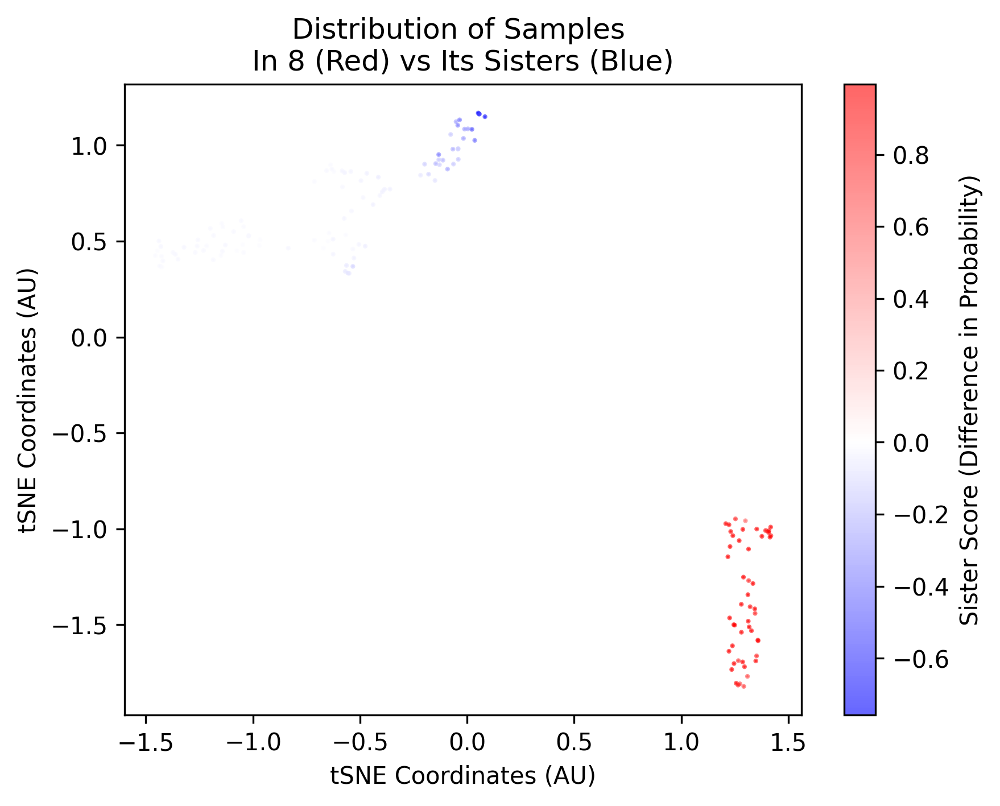

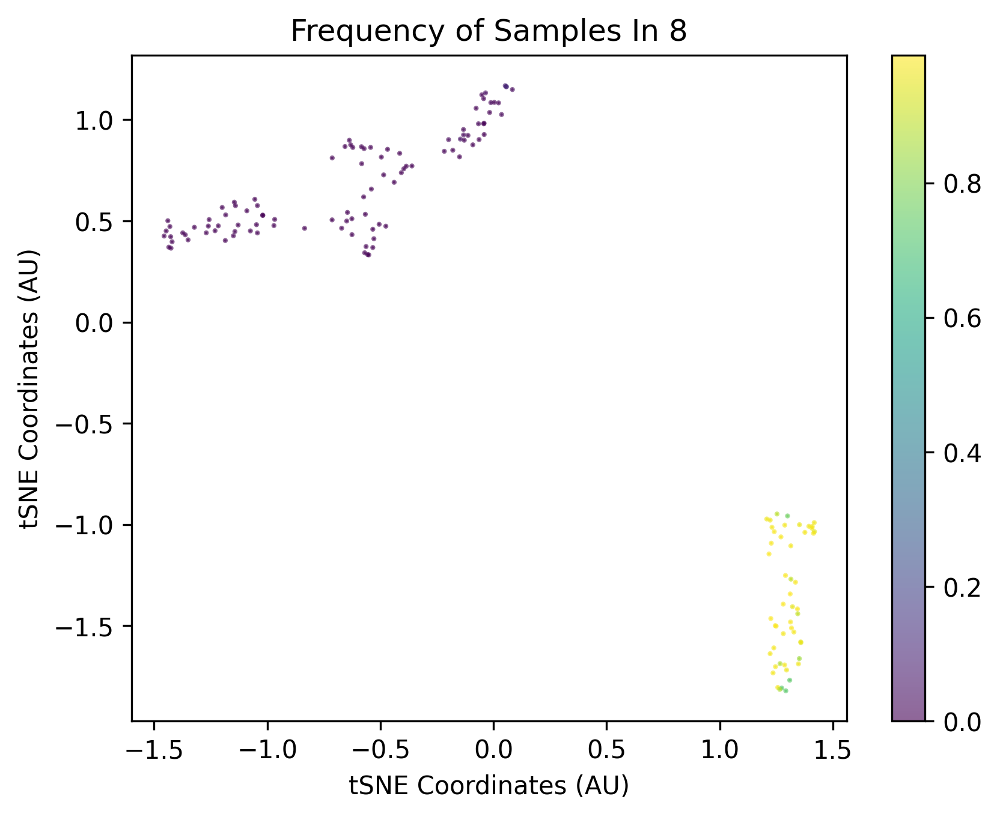

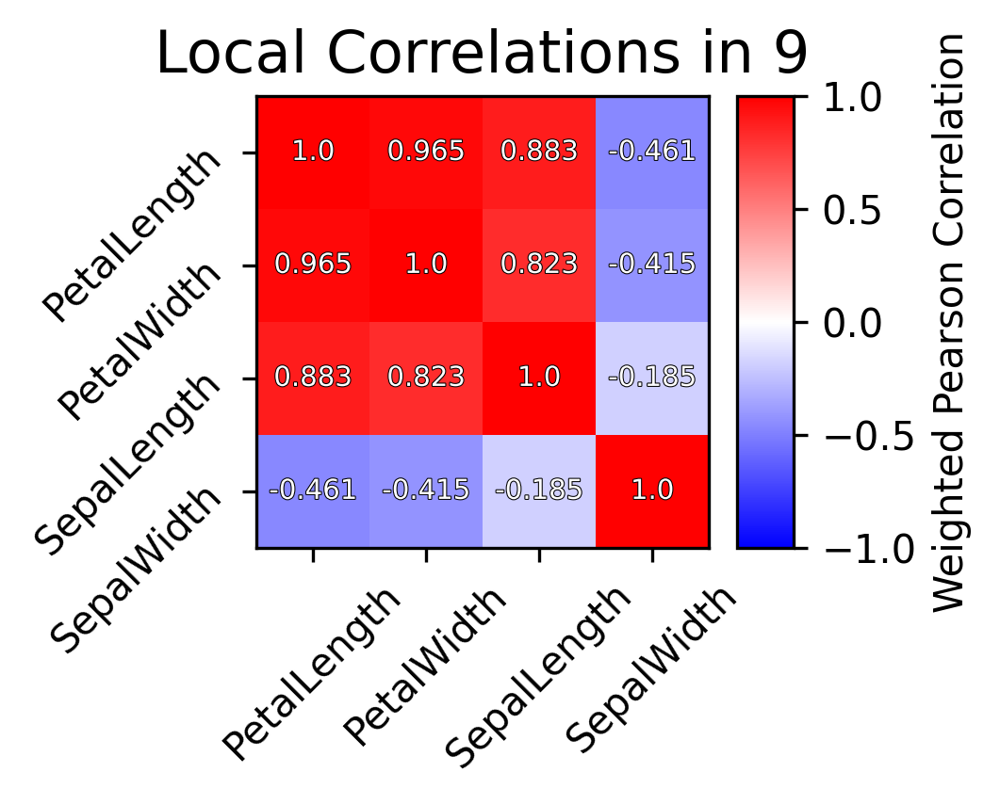

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


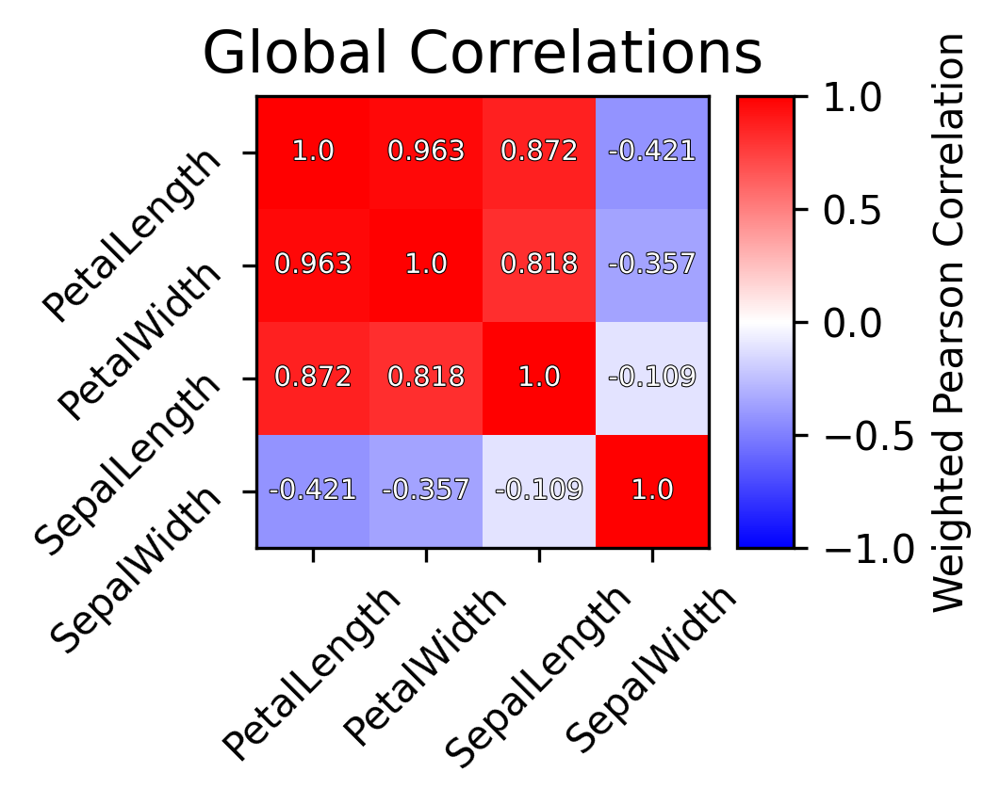

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/9/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

Summarizing:10
Error: P:[ 34.37247144   6.07989298 121.11407635  22.92276734],A:[ 33.8249844    8.73103521 124.96917804  23.18841708]
Error ratio: [1.0157211  0.72755805 0.96939647 0.98901748]
Generating top local


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:601: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


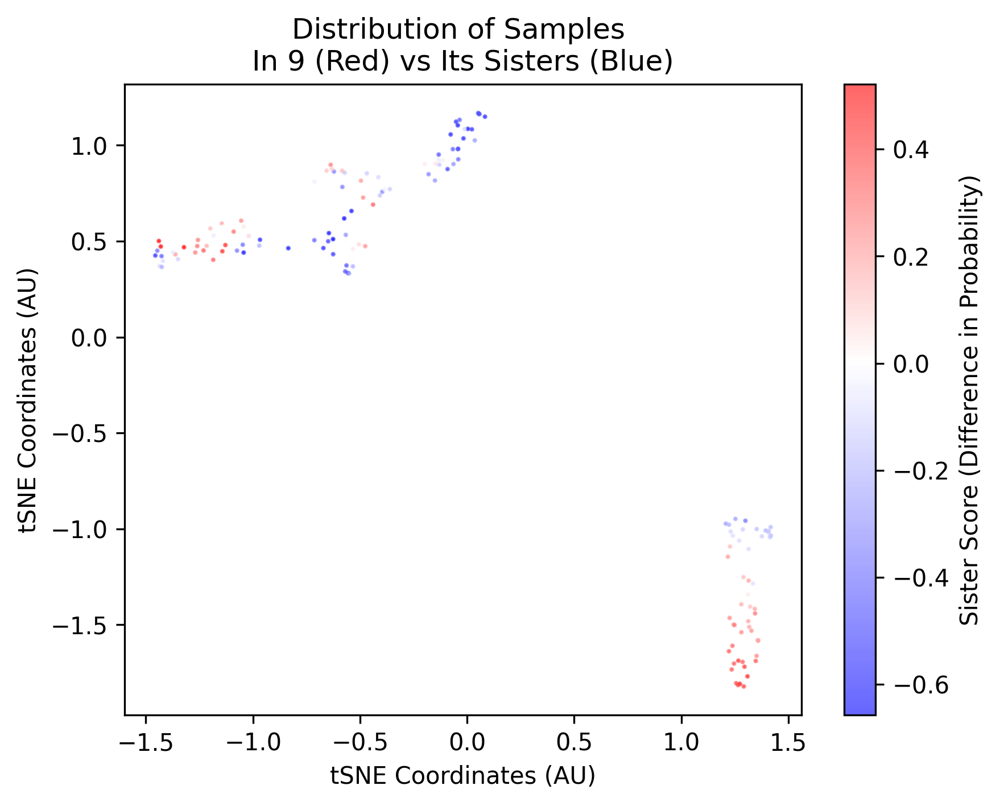

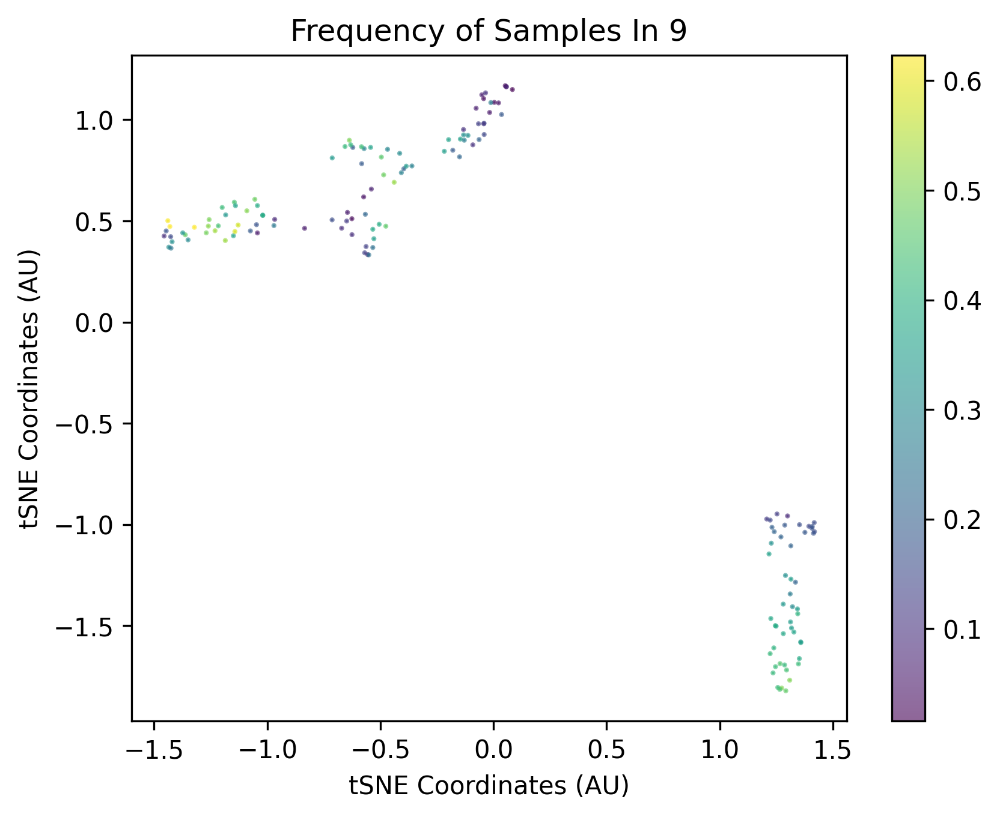

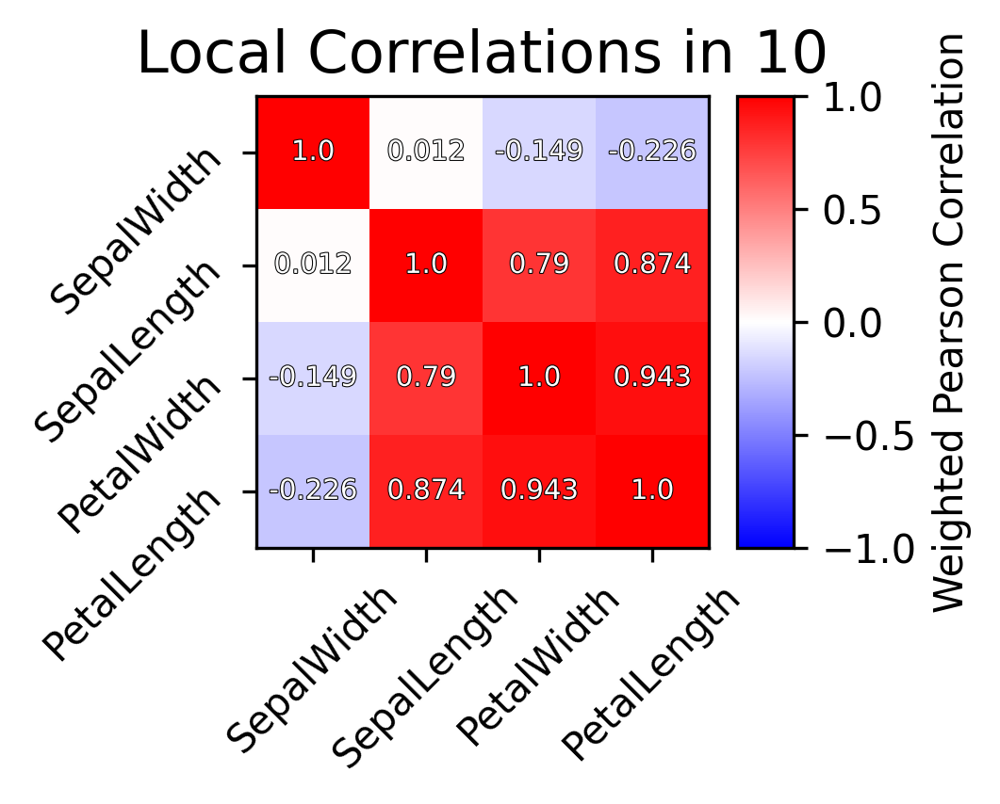

Generating top global


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/node_cluster.py:631: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


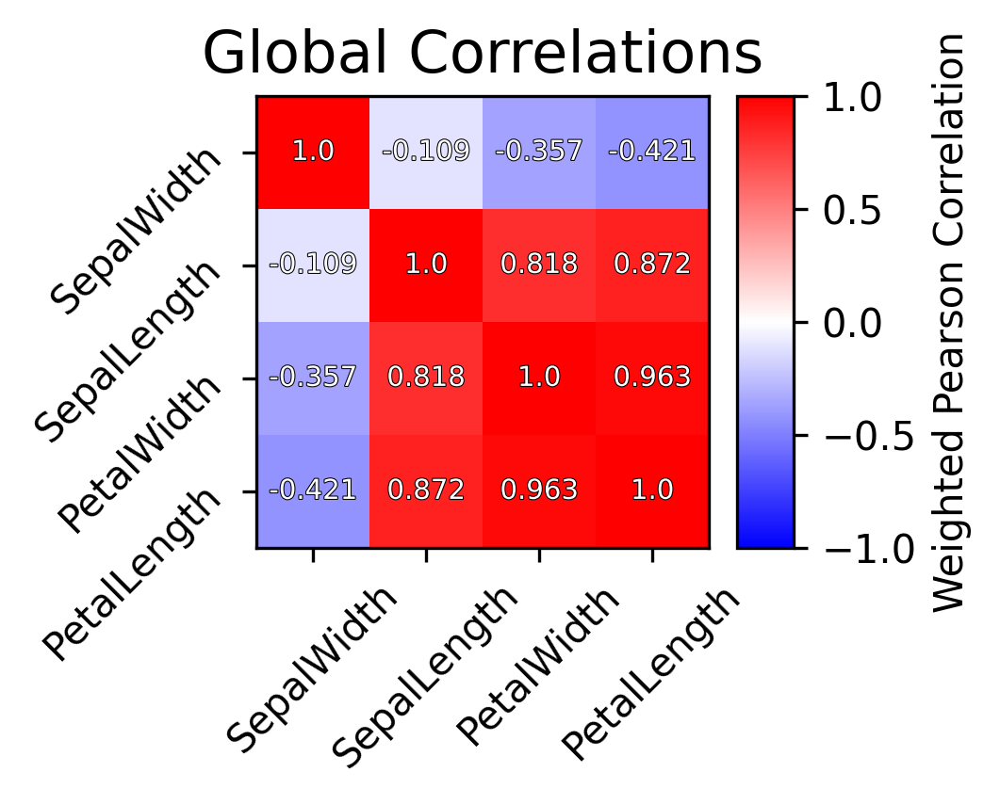

Saving cross ref to /Users/bbrener1/miniconda3/lib/python3.7/site-packages/rusty_axe/html/10/
Rendering scores


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

In [14]:
forest.html_tree_summary(
    
    n=2,
    # This parameter controls how many features are used when summarizing particular nodes. 
    
    output=None
    # If you would like your HTML report to be saved to a particular location, put it here. 
)

What happened here?

We have clustered the nodes of the RFR into groups based on the effects they predict in their children. Each group of nodes is called a "factor" because similarly to factors used in factor analysis, they summarize the behavior of several observed variables that tend to move together in some way. Like other factors, RF factors produce certain "scores" for each sample, reflecting the likelihood that an effect predicted by the factor "applies" to a particular sample.

Factors can also give "sister scores" 

After you've looked at the consensus tree, you may want to start annotating the individual clusters.

For example, let's sort the clusters by sepal length, and call the cluster that predicts the most negative partial effect for sepal length as probably describing Iris Setosa vs all others. 

We will obtain a matrix of the average partial values for each factor for a set of features


In [15]:

sepal_partials = forest.factor_partial_matrix(
    features = ['SepalLength','SepalWidth']
    # For datasets with (too) many features it is possible to compute partials and gains only for some features
    # Or leave this option blank to get the partials for all features in the order they are in your header
)

sepal_partials

array([[ 0.98471126,  0.9884752 ],
       [ 0.58250249,  0.4829915 ],
       [-0.56384768, -0.48489345],
       [-0.62074455,  0.40064932],
       [ 0.45993685, -0.28050567],
       [-0.48955921,  0.03299051],
       [ 0.56127189, -0.03762008],
       [ 0.24708301, -0.71090459],
       [-0.16089584,  0.42972   ],
       [ 0.07753985,  0.49279102],
       [-0.08854605, -0.58396349]])

In [17]:

setosa_factor = forest.factors[np.argsort(sepal_partials[:,0])[0]]

setosa_factor.set_name("Setosa")

print(f"Setosa flowers are contained in cluster {setosa_factor.id}")

Setosa flowers are contained in cluster 3


Now let's look at the setosa factor in more detail.

We can plot the distribution of its sister scores on our UMAP

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


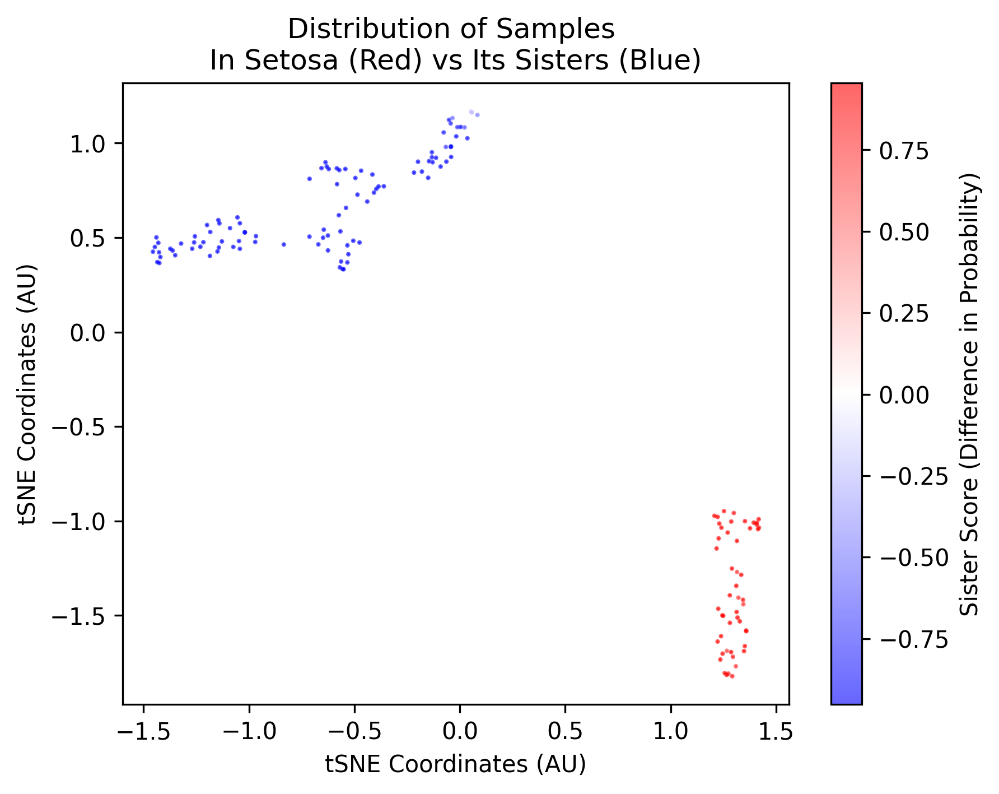

In [18]:

setosa_factor.plot_sister_scores()


Or we can look at other features that are highly explained by this factor
Let's leave the features field blank and look at the partials for everything:


In [19]:

setosa_partials = setosa_factor.feature_partials()

print(list(zip(forest.output_features,setosa_partials)))

[('SepalLength', -0.620744551047988), ('SepalWidth', 0.40064932187207836), ('PetalLength', -0.9054764112387529), ('PetalWidth', -0.8079510857948687)]


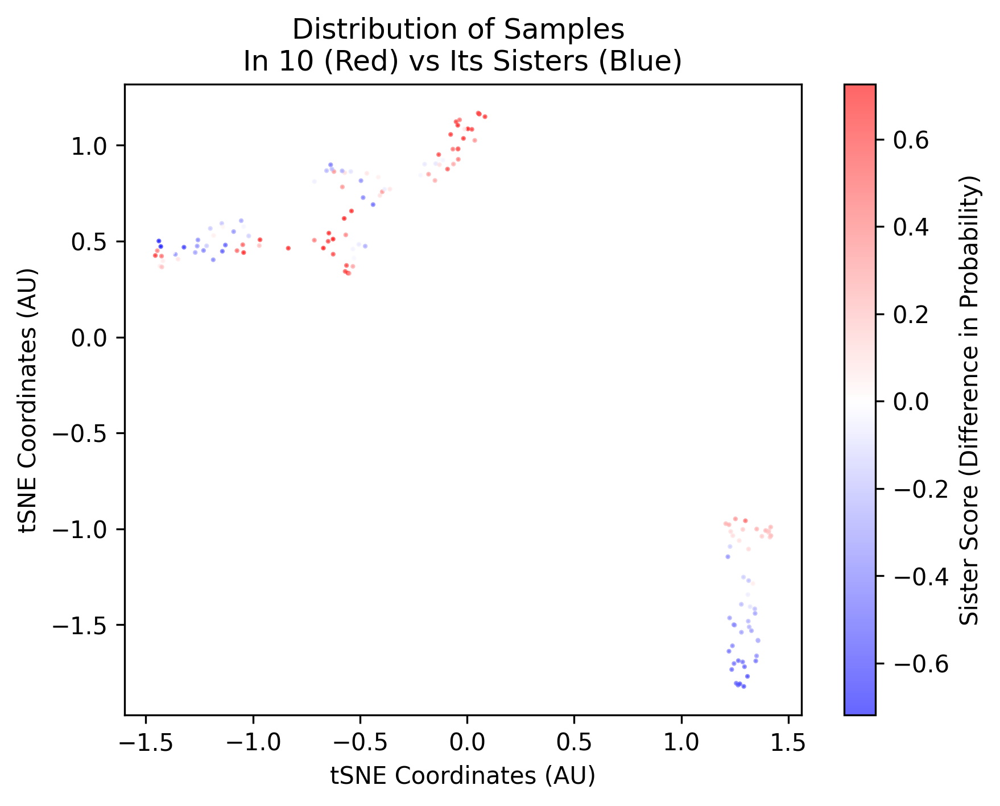

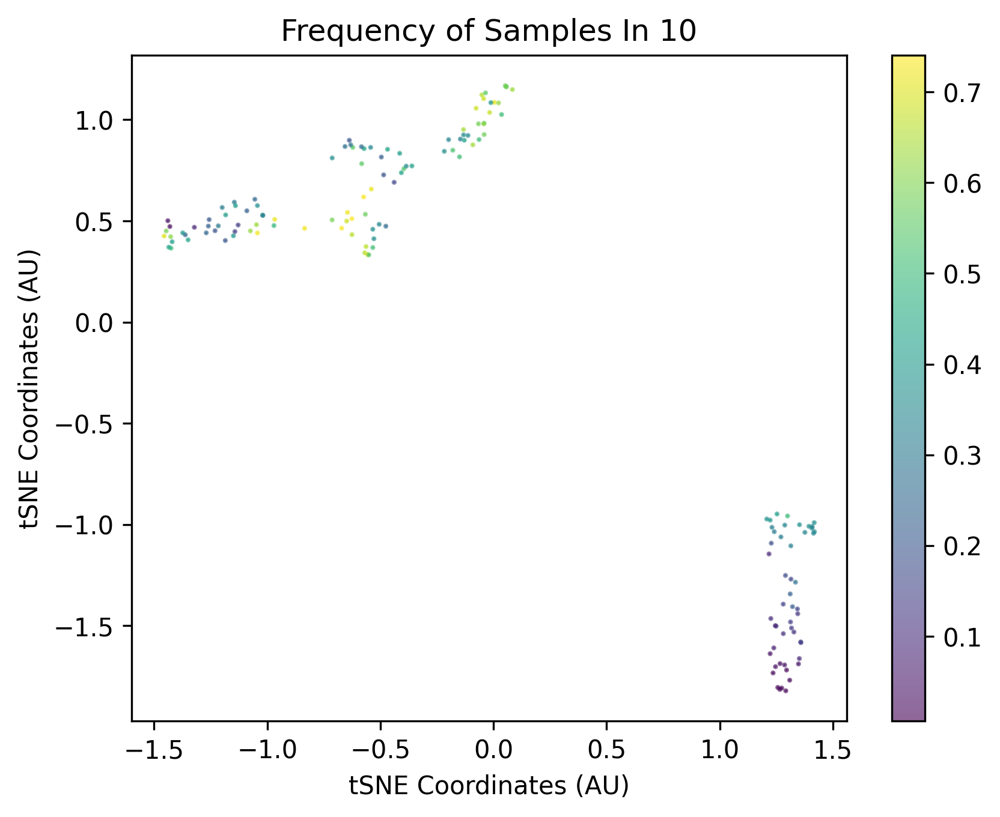

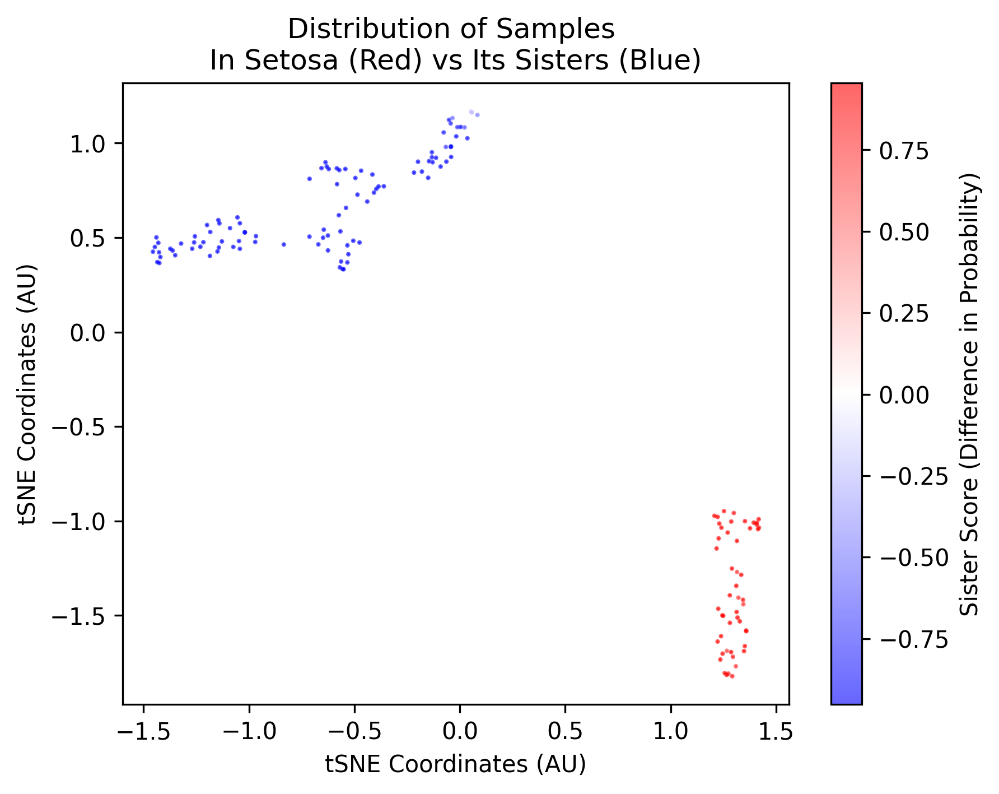

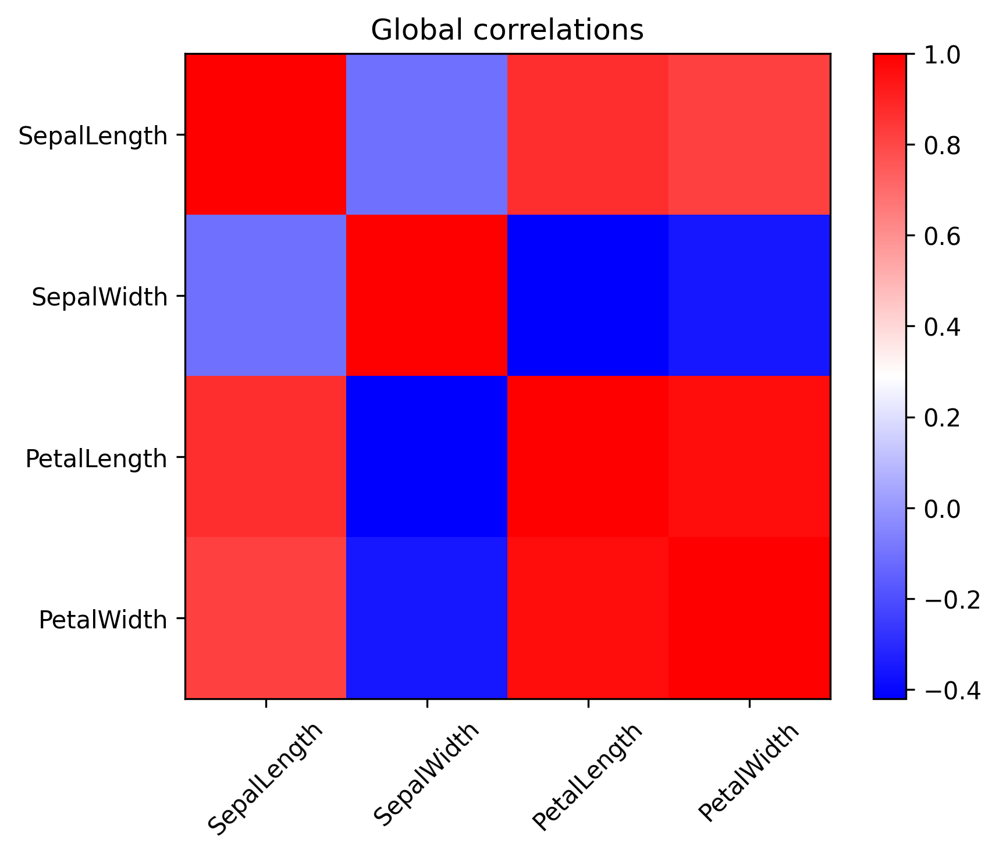

In [20]:
# We also see a large partial effect for petal length. It seems like these two traits may be correlated. 
# Is that true globally?

g_corr = forest.global_correlations()

plt.figure()
plt.title("Global correlations")
plt.imshow(g_corr,cmap='bwr')
plt.xticks(np.arange(4),forest.output_features,rotation=45)
plt.yticks(np.arange(4),forest.output_features)
plt.colorbar()
plt.show()

Hmm. Seems so! Let's check if there are any features that have a strange local behavior.

(By the way, you should generally ignore the behavior of the root factor (factor 0), it's sort of special 
due to not having parents.)


In [21]:
for factor in forest.factors:
    
    # We are going to check to compare the difference between local and global 
    # correlations for all features in every factor and see any extreme values
    # show up
    
    delta = np.around((forest.global_correlations() - factor.local_correlations()).flatten(),3)

    print(factor.name())
    print(sorted(delta)[:3])
    print(sorted(delta)[-3:])

0
[0.0, 0.0, 0.0]
[0.0, 0.0, 0.0]
1
[0.0, 0.0, 0.0]
[0.106, 0.157, 0.157]
2
[-0.018, -0.018, -0.013]
[0.055, 0.078, 0.078]
Setosa
[-0.671, -0.671, -0.079]
[0.533, 0.602, 0.602]
4
[-0.805, -0.805, -0.794]
[0.13, 0.231, 0.231]
5
[-0.01, -0.01, 0.0]
[0.135, 0.155, 0.155]
6
[-0.364, -0.364, -0.306]
[0.086, 0.19, 0.19]
7
[-0.303, -0.303, -0.082]
[0.17, 0.198, 0.198]
8
[-0.799, -0.799, -0.411]
[0.547, 0.623, 0.623]
9
[-0.011, -0.011, -0.005]
[0.059, 0.075, 0.075]
10
[-0.207, -0.207, -0.194]
[0.019, 0.028, 0.028]


In [22]:
# What if we compare the local and global correlations for petal length and sepal width?

for factor in forest.factors:
    petal_width_index = list(forest.output_features).index('PetalLength')
    sepal_length_index = list(forest.output_features).index('SepalWidth')
    
    l_corr = factor.local_correlations()[petal_width_index,sepal_length_index]
    g_corr = forest.global_correlations()[petal_width_index,sepal_length_index]
    
    l_corr = np.around(l_corr,3)
    g_corr = np.around(g_corr,3)
    
    print(f"{factor.name()}: {l_corr} vs {g_corr}, \t Δ:{np.around(g_corr-l_corr,3)}")
    

0: -0.421 vs -0.421, 	 Δ:0.0
1: -0.527 vs -0.421, 	 Δ:0.106
2: -0.408 vs -0.421, 	 Δ:-0.013
Setosa: -0.377 vs -0.421, 	 Δ:-0.044
4: 0.374 vs -0.421, 	 Δ:-0.795
5: -0.555 vs -0.421, 	 Δ:0.134
6: -0.115 vs -0.421, 	 Δ:-0.306
7: -0.338 vs -0.421, 	 Δ:-0.083
8: -0.071 vs -0.421, 	 Δ:-0.35
9: -0.461 vs -0.421, 	 Δ:0.04
10: -0.226 vs -0.421, 	 Δ:-0.195



You might notice that for one of your clusters, there's a big difference in behavior (in fact the correlation might even switch sign!)

This is an example of "local behavior" that can be discovered using this kind of analysis. 

(I can't tell you which cluster it will be because this process is stochastic so the clusters might show up in a different order for you. That's why it's a good idea to save your forests after you train them!)

## Methods for describing factors

Here is a summary of the most useful methods for describing the behavior of factors:


In [23]:
factor = forest.factors[1]

This method returns factor sample scores for each sample in your dataset. This is where the factor "applies", and represents the frequency with which each sample is encountered in the nodes making up the factor. 


/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklear

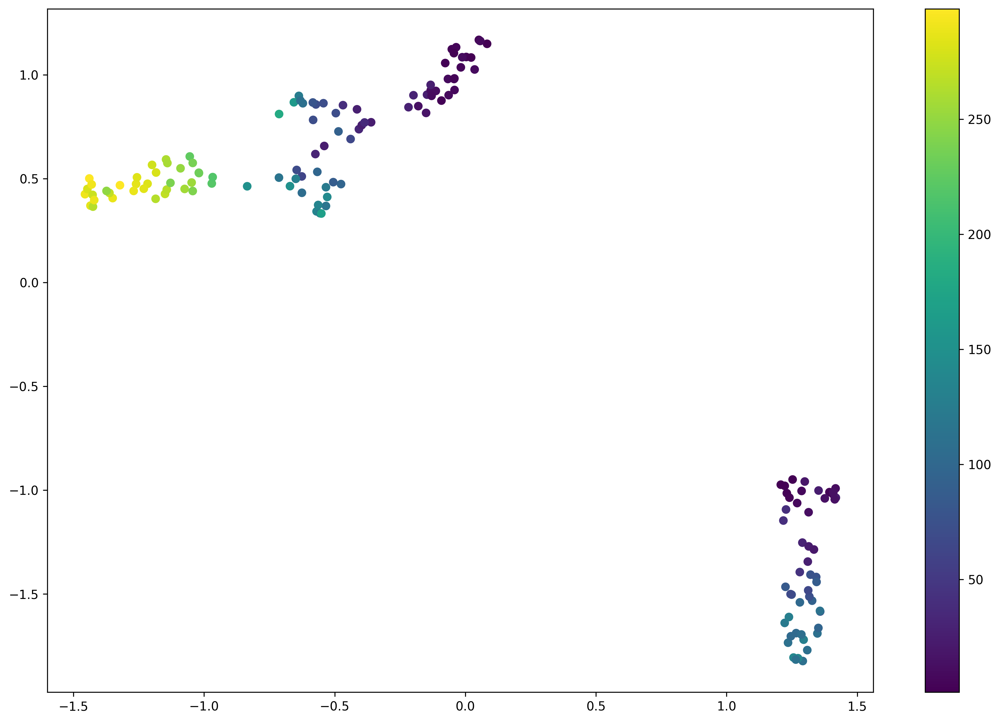

In [24]:
factor.sample_scores()
# This returns an array of the actual scores of size N where N is the number of samples in the training set.

# The corresponding plotting method is:
factor.plot_sample_counts()
# This returns a matplotlib figure instance you can decorate to your heart's content. 

This method returns a factor sister score for each sample in your dataset. This is similar to the sample score, but it tells you if this factor has a well defined sisteror if it's just being split off from the overall population in general. Samples with a positive score are encountered frequently in this factor, and samples with a negative score are encountered frequentlyin the sisters of this factor.

For more details please see the paper or figure notebooks. 

/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:194: UserWarning: Numerical issues were encountered when centering the data and might not be solved. Dataset may contain too large values. You may need to prescale your features.
  warnings.warn("Numerical issues were encountered "
/Users/bbrener1/miniconda3/lib/python3.7/site-packages/sklearn/preprocessing/_data.py:211: UserWarning: Numerical issues were encountered when scaling the data and might not be solved. The standard deviation of the data is probably very close to 0. 
  warnings.warn("Numerical issues were encountered "


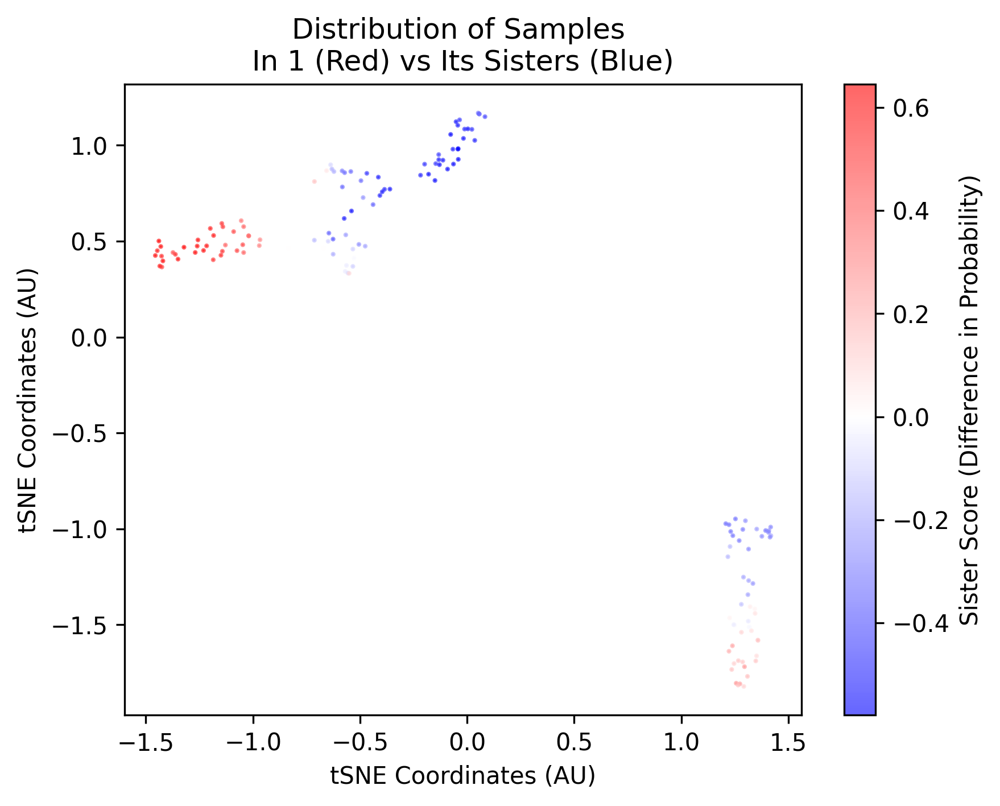

In [25]:
factor.sister_scores()
# 
# The corresponding plotting method is:

factor.plot_sister_scores()


Unnormalized difference in means relative to the parent. This is the "simple" prediction that nodes in this factor make. If on average height in the US is 68 inches, but 66 inches for women and 70 inches for men, then the factor corresponding to male sex will have conditional gain of 2 (+2 inches on average) and the sister factor of the male factor (the female factor) will have a conditional gain of -2 (-2 inches on average)


In [26]:
ffcg = factor.feature_conditional_gains(
    features = None
)

# If you wish to save computational time, you can specify only particular features be returned. 
# Returned values are in the order in which you specified the features.

ffcg = factor.feature_conditional_gains(
    features = ['SepalLength','PetalWidth']
)

# This returns a matrix of dimension N x 2, where column 1 is Sepal Length conditional gain and column 2 
# is Petal Width conditional gain. 

# These values are NOT normalized for children.


This method provides you with feature partials for the factor. This is the percentage of the total variance in a given feature explained by this factor. The percentage is signed, and the sign represents if the feature is positively or negatively regressed by this factor. (Eg, -.75 means that this factor explains 75% of all variance for a feature, and the value of the feature is lower in this factor than overall.)


In [27]:
ffp = factor.feature_partials(
    features = None
    # If you wish to save time, you can specify only particular features be returned, same as with conditional gains.
)

Node 0


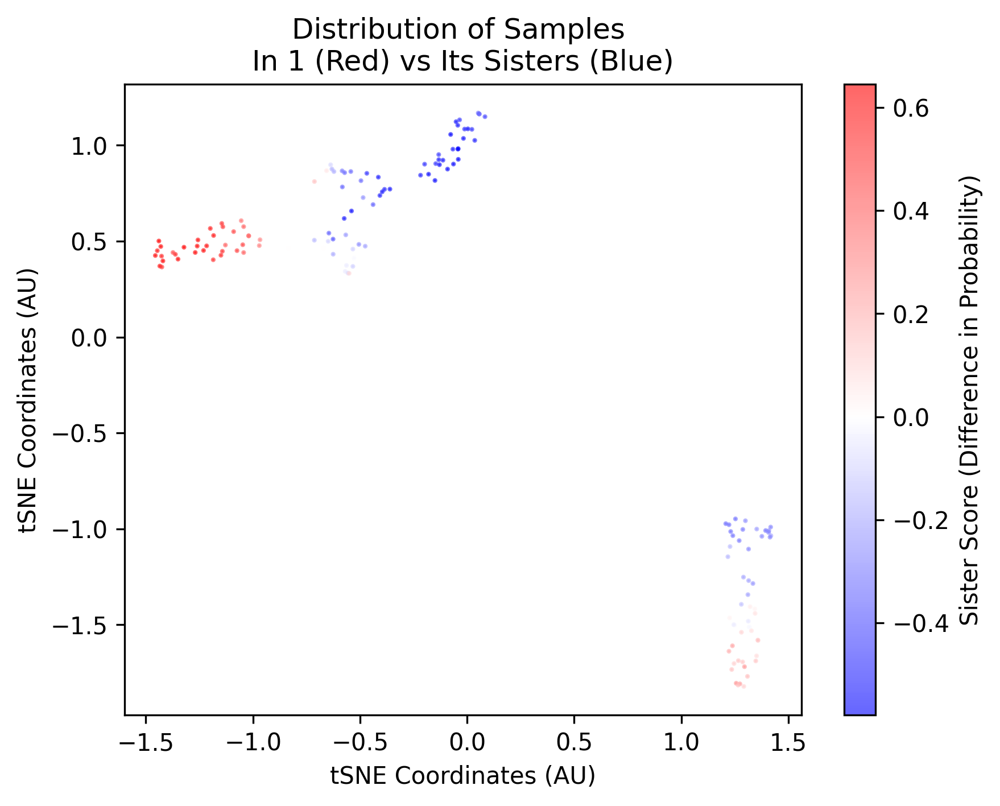

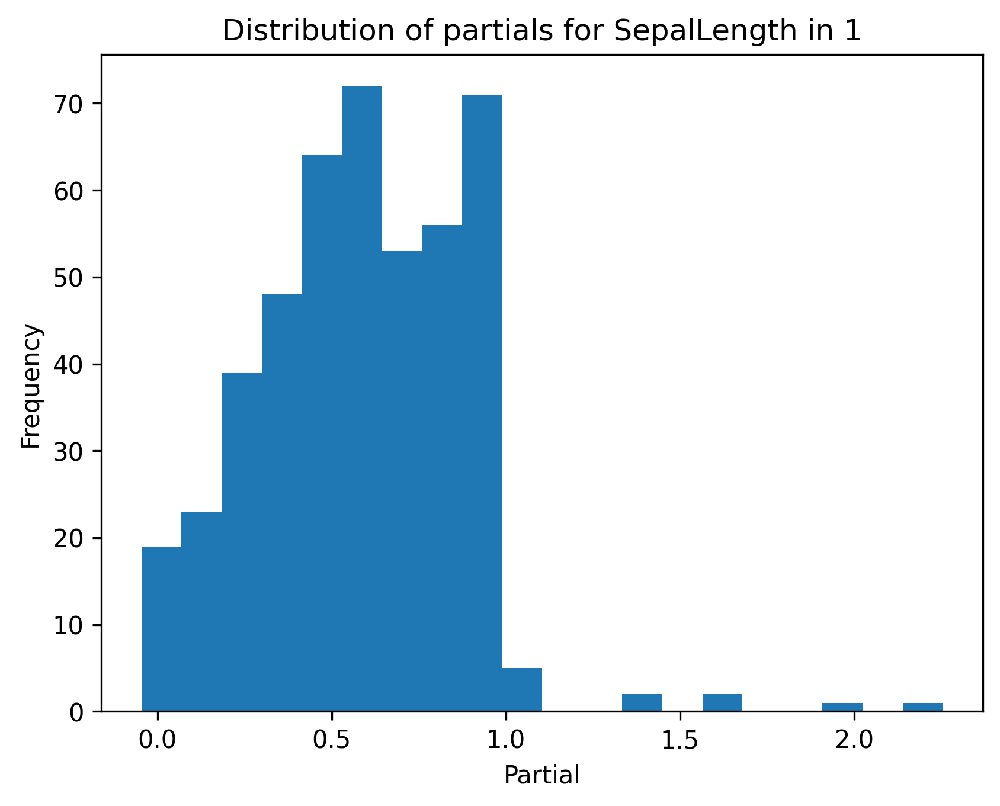

In [28]:
factor.nodes
# This is a property, not a method, but gives you access to all nodes that a factor is made up of. 
# This is useful if you want to manually examine various properties of said nodes. 

# A typical use case might be to ask what the distribution of the partials in the factor is for each feature
# (eg are there a few nodes making really good predictions or many nodes making ok predictions?)

all_partials = forest.node_representation(factor.nodes,mode='partials')

plt.figure()
plt.title(f"Distribution of partials for {forest.output_features[0]} in {factor.name()}")
plt.hist(all_partials[:,0],bins=20)
plt.xlabel("Partial")
plt.ylabel("Frequency")
plt.show()

## Methods for working with nodes

Here is a summary of the most useful methods for working with nodes directly:


In [29]:

nodes = forest.nodes(
    
    # By default returns all nodes in the forest. The order is consistent every time if filtering is not applied.

    # For convenience you can also specify these filters: 
    root = True,
    # Include roots in the list of nodes returned? Certain values are a bit strange for roots since 
    # they have no parents. 
    
    depth = None,
    # Return nodes no deeper than this argument.     
)


In [30]:
leaves = forest.leaves(
    # Returns all the leaves in the forest. Leaves are nodes with no children.
    depth = None,
    # If you specify an integer value n here, this method will return leaves OR the nodes at depth n, whichever 
    # is shallower.

)


Perhaps the most important method for working with nodes generally is **node_representation**

**node_representation** takes a list of nodes as a positional argument. After this you can specify what kind of representation you wish to see. We've already covered most of the options but here they are again:

* sister
* sample
* additive_mean OR conditional_gain (these are the same)
* partial
* mean 
* median

Finally, another useful representation is the node-factor encoding, which is a boolean matrix of size Node X Factor, where i,j is true if Node i belongs to factor j. 

In [31]:
partials = forest.node_representation(nodes, mode='partials')

Node 7000
